importing libaries

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 4.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
import requests
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.patches as patches
from ultralytics import YOLO
from ultralytics.utils.benchmarks import benchmark
import shutil
import cv2
import yaml

: 

helper methods

In [ ]:
def count_files_of_type(directory, file_extension):
    count = 0

    for file_name in os.listdir(directory):
        if file_name.endswith(file_extension):
            count += 1

    return count

In [ ]:
def plot_image_grid(images_directory_path, n = 3, m = 3):
    image_paths = [os.path.join(images_directory_path, filename) for filename in os.listdir(images_directory_path) if filename.lower().endswith('.jpg')]
    _, axes = plt.subplots(m, n, figsize=(n*3, m*3))

    for i, ax in enumerate(axes.flat):
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

**Downloading the Dataset**

In [5]:
dataset_directory = './dataset'
os.makedirs(dataset_directory, exist_ok=True)

birds_csv_data_path = os.path.join(dataset_directory, 'csv_data')
os.makedirs(birds_csv_data_path, exist_ok=True)

birds_images_path = os.path.join(dataset_directory, 'images')
os.makedirs(birds_images_path, exist_ok=True)

In [4]:
bird_types =  ['pigeon', 'crow', 'other-bird', 'wood-pigeon', 'dove', 'magpie', 'jay', 'tit', 'thrush']

In [ ]:
for bird_type in bird_types:
    os.makedirs(os.path.join(birds_images_path, bird_type), exist_ok=True)

*manually downloading bird csv data from https://ebird.org/home for all image types and mix bird types*

download top 500 images for each bird type

In [ ]:
def download_and_save_image(image_id, save_directory_path):
    response = requests.get(f'https://cdn.download.ams.birds.cornell.edu/api/v2/asset/{image_id}/1200')

    if response.status_code == 200:

        save_path = os.path.join(save_directory_path, str(image_id) + '.jpg')

        with open(save_path, 'wb') as f:
            f.write(response.content)

    else:
        print(f"failed to download image. status code: {response.status_code}. image id: {image_id}")

In [ ]:
number_of_images = 500

for bird_type in bird_types:

    bird_images_path = os.path.join(birds_images_path, bird_type)

    if count_files_of_type(bird_images_path, '.jpg') >= number_of_images:
        continue

    df = pd.read_csv(os.path.join(birds_csv_data_path, bird_type + '.csv'))
    df = df.sort_values(by='Average Community Rating', ascending=False)
    df = df.head(number_of_images)

    image_ids = df['ML Catalog Number'].values

    for image_id in image_ids:
        download_and_save_image(image_id, bird_images_path)

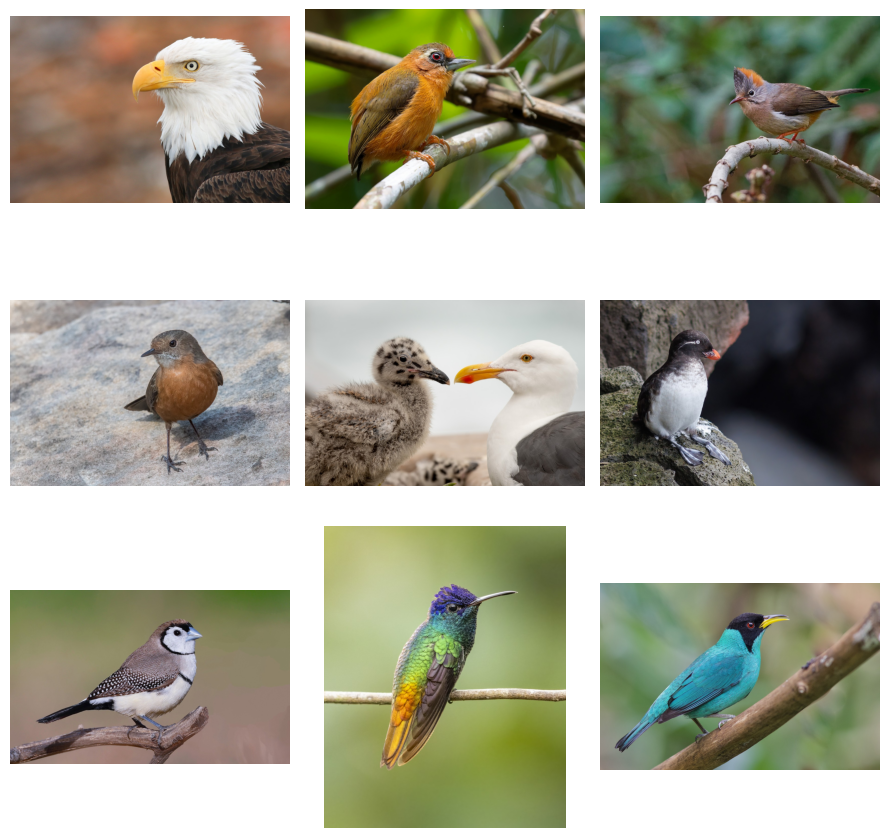

In [ ]:
plot_image_grid(os.path.join(birds_images_path, bird_types[2]))

**Preprocessing the Dataset**

In [8]:
processed_birds_images_path = os.path.join(dataset_directory, 'processed_images')
os.makedirs(birds_images_path, exist_ok=True)

for bird_type in bird_types:
    os.makedirs(os.path.join(processed_birds_images_path, bird_type), exist_ok=True)

normalizing and resizing images

In [9]:
def preprocess_image(image, input_shape=(416, 416)):

    image = image.resize(input_shape)
    image_array = np.array(image)
    image = image_array.astype(float) / 255.0

    return image

In [ ]:
for bird_type in bird_types:
    bird_images_path = os.path.join(birds_images_path, bird_type)
    processed_bird_images_path = os.path.join(processed_birds_images_path, bird_type)

    if count_files_of_type(processed_bird_images_path, '.jpg') >= number_of_images:
        continue

    images_names = [image for image in os.listdir(bird_images_path)]

    for image_name in images_names:

        image_path = os.path.join(bird_images_path, image_name)
        processed_image = preprocess_image(Image.open(image_path))

        processed_image_rgb = (processed_image * 255).astype(np.uint8)
        processed_image_rgb = Image.fromarray(processed_image_rgb).convert('RGB')

        processed_image_path = os.path.join(processed_bird_images_path, image_name)
        processed_image_rgb.save(processed_image_path)

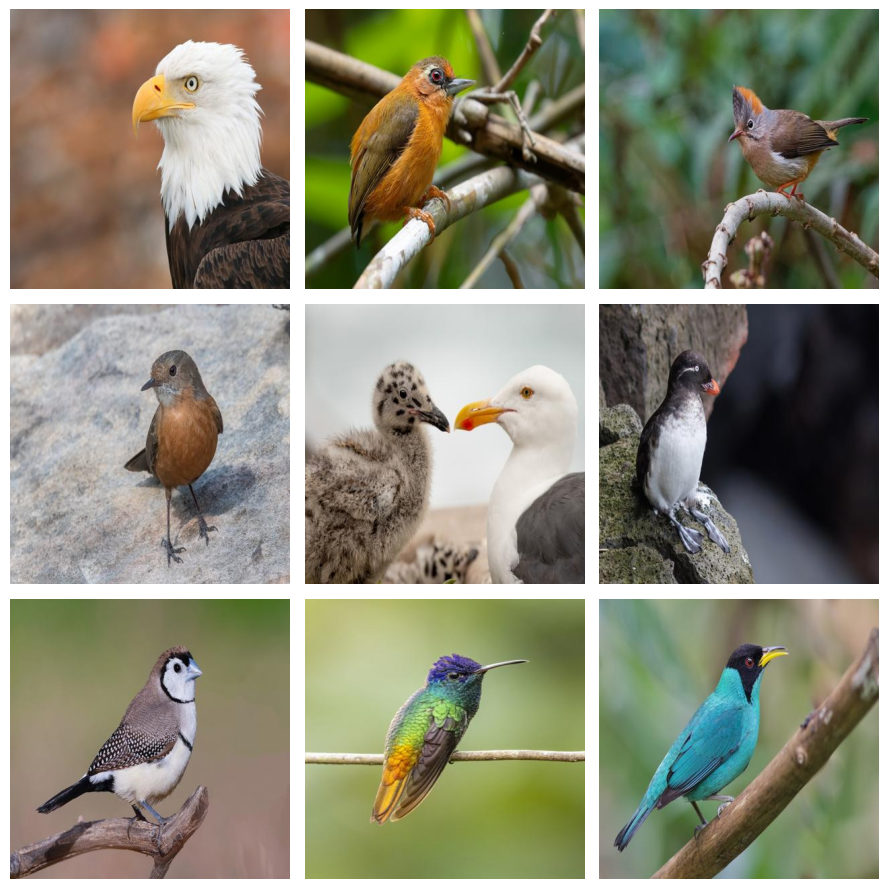

In [ ]:
plot_image_grid(os.path.join(processed_birds_images_path, bird_types[2]))

*manualy labeling images using labelImg package (the poor quality images are not getting labeled)*

In [11]:
bird_index_dict = {string: index for index, string in enumerate(bird_types)}

In [7]:
sets = ['train', 'val', 'test']

splitting images into train val and test datasets with other-birds class

In [16]:
for set in sets:
    os.makedirs(os.path.join(dataset_directory, 'dataset_split_with_other-birds', set), exist_ok=True)

In [13]:
def voc_to_yolo(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    size = root.find('size')
    image_width = int(size.find('width').text)
    image_height = int(size.find('height').text)

    yolo_annotations = []
    for obj in root.findall('object'):
        class_name = obj.find('name').text
        class_id = bird_index_dict.get(class_name, -1)
        if class_id == -1:
            continue

        bbox = obj.find('bndbox')
        xmin = float(bbox.find('xmin').text)
        ymin = float(bbox.find('ymin').text)
        xmax = float(bbox.find('xmax').text)
        ymax = float(bbox.find('ymax').text)

        width = xmax - xmin
        height = ymax - ymin
        x_center = (xmin + xmax) / 2
        y_center = (ymin + ymax) / 2
        x_center /= image_width
        y_center /= image_height
        width /= image_width
        height /= image_height

        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_annotations

In [17]:
for bird_type in bird_types:
    processed_bird_images_path = os.path.join(processed_birds_images_path, bird_type)

    xml_labels =  [file for file in os.listdir(processed_bird_images_path) if file.endswith('.xml')]
    number_of_labels = len(xml_labels)

    for i, xml_label in enumerate(xml_labels):

        xml_label_path = os.path.join(processed_bird_images_path, xml_label)
        yolo_annotations = voc_to_yolo(xml_label_path)

        if i < number_of_labels * 0.70:
            output_set = sets[0]
        elif i < number_of_labels * 0.85:
            output_set = sets[1]
        else:
            output_set = sets[2]


        bird_number = os.path.splitext(xml_label)[0]
        output_directory = os.path.join(dataset_directory, 'dataset_split_with_other-birds', output_set)

        with open(os.path.join(output_directory, bird_number + '.txt'), 'w') as f:
            f.write('\n'.join(yolo_annotations))

        shutil.copyfile(os.path.join(processed_bird_images_path, bird_number + '.jpg'), os.path.join(output_directory, bird_number + '.jpg'))

splitting images into train val and test datasets without other-birds class

In [18]:
for set in sets:
    os.makedirs(os.path.join(dataset_directory, 'dataset_split_without_other-birds', set), exist_ok=True)

In [19]:
bird_types =  ['pigeon', 'crow', 'wood-pigeon', 'dove', 'magpie', 'jay', 'tit', 'thrush']

In [20]:
bird_index_dict = {string: index for index, string in enumerate(bird_types)}

In [21]:
for bird_type in bird_types:
    processed_bird_images_path = os.path.join(processed_birds_images_path, bird_type)

    xml_labels =  [file for file in os.listdir(processed_bird_images_path) if file.endswith('.xml')]
    number_of_labels = len(xml_labels)

    for i, xml_label in enumerate(xml_labels):

        xml_label_path = os.path.join(processed_bird_images_path, xml_label)
        yolo_annotations = voc_to_yolo(xml_label_path)

        if i < number_of_labels * 0.70:
            output_set = sets[0]
        elif i < number_of_labels * 0.85:
            output_set = sets[1]
        else:
            output_set = sets[2]


        bird_number = os.path.splitext(xml_label)[0]
        output_directory = os.path.join(dataset_directory, 'dataset_split_without_other-birds', output_set)

        with open(os.path.join(output_directory, bird_number + '.txt'), 'w') as f:
            f.write('\n'.join(yolo_annotations))

        shutil.copyfile(os.path.join(processed_bird_images_path, bird_number + '.jpg'), os.path.join(output_directory, bird_number + '.jpg'))

In [23]:
def plot_images_with_labels(images_and_labels_dir):
    _, axes = plt.subplots(3, 3, figsize=(10, 10))
    axes = axes.flatten()

    image_label_pairs = [(file, file.replace('.jpg', '.txt')) for file in os.listdir(images_and_labels_dir) if file.endswith('.jpg')]

    for i, (image_file, label_file) in enumerate(image_label_pairs[:9]):
        image_path = os.path.join(images_and_labels_dir, image_file)
        label_path = os.path.join(images_and_labels_dir, label_file)

        image = Image.open(image_path)

        axes[i].imshow(image)
        axes[i].axis('off')

        with open(label_path, 'r') as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.split())

                x_min = (x_center - width / 2) * image.width
                y_min = (y_center - height / 2) * image.height
                bbox_width = width * image.width
                bbox_height = height * image.height

                bbox = patches.Rectangle((x_min, y_min), bbox_width, bbox_height, linewidth=1, edgecolor='r', facecolor='none')

                axes[i].add_patch(bbox)

                bird_type = bird_types[int(class_id)]
                axes[i].set_title(bird_type)

    plt.tight_layout()
    plt.show()

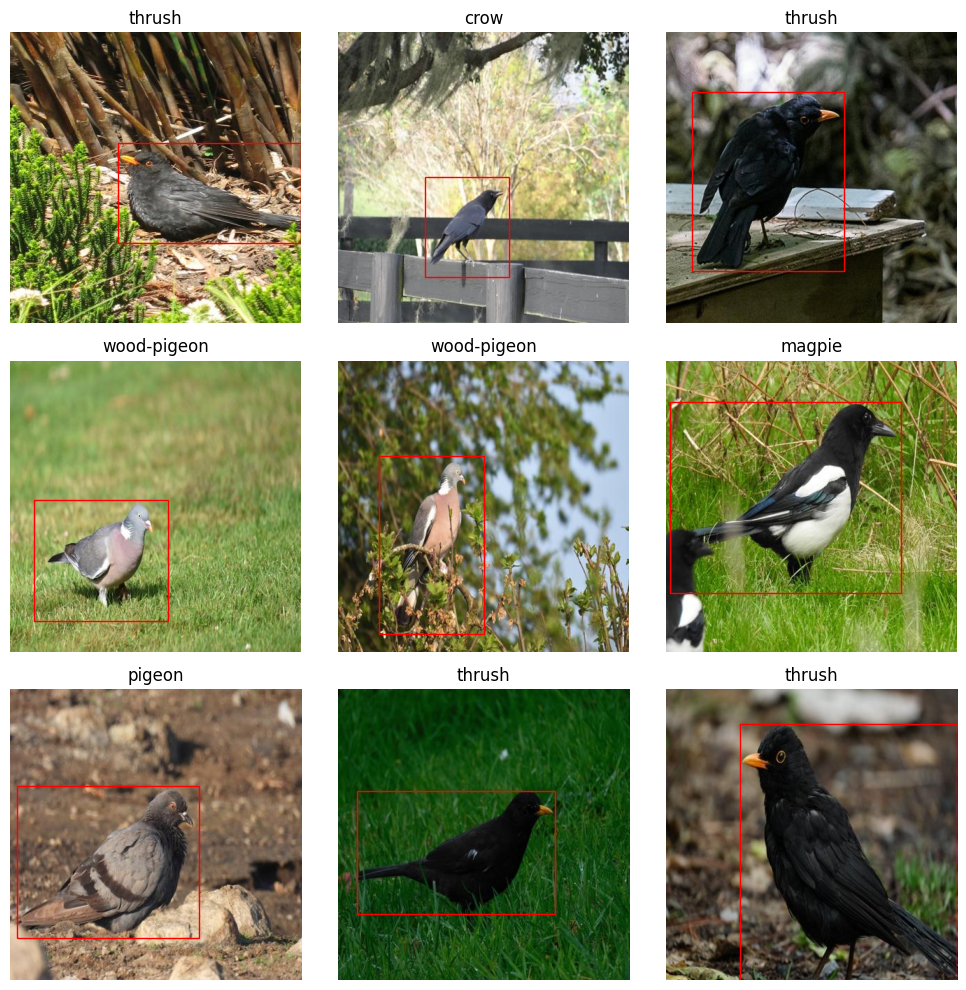

In [27]:
images_directory = os.path.join(dataset_directory, 'dataset_split_without_other-birds', sets[0])
plot_images_with_labels(images_directory)

**Training the Model**

*the training is done in google collab*

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


YOLOv8n with other-birds

In [5]:
model = YOLO('yolov8n.pt')

model.info()

results = model.train(
    data='dataset_info_with_other_birds.yaml',
    epochs=150,
    imgsz=416,
    device=0,
    batch=-1,
    pretrained=True,
    optimizer='Adam',
    lr0=0.001,
    momentum=0.9,
    weight_decay=0.0001,
    val=True,
    save=True,
    save_period=10,
    cache=True,
    workers=8,
    name='experiment_1_YOLOv8n_with_other-birds',
    deterministic=True,
    amp=True
)

100%|██████████| 6.23M/6.23M [00:00<00:00, 73.1MB/s]


YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs
Ultralytics YOLOv8.2.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset_info.yaml, epochs=150, time=None, patience=100, batch=-1, imgsz=416, save=True, save_period=10, cache=True, device=0, workers=8, project=None, name=experiment_1, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_c

100%|██████████| 755k/755k [00:00<00:00, 16.0MB/s]


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/dataset/train.cache... 2781 images, 34 backgrounds, 0 corrupt: 100%|██████████| 2781/2781 [00:00<?, ?it/s]
train: Caching images (1.3GB RAM): 100%|██████████| 2781/2781 [02:34<00:00, 18.04it/s] 


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/dataset/val.cache... 597 images, 6 backgrounds, 0 corrupt: 100%|██████████| 597/597 [00:00<?, ?it/s]
val: Caching images (0.3GB RAM): 100%|██████████| 597/597 [00:05<00:00, 113.13it/s]


Plotting labels to runs/detect/experiment_1/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0003203125), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/experiment_1
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      12.4G      1.377      3.547      1.505        274        416: 100%|██████████| 14/14 [00:21<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.43s/it]

                   all        597        632      0.023      0.375     0.0162    0.00228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150        11G       1.14      2.734       1.28        281        416: 100%|██████████| 14/14 [00:19<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.35s/it]


                   all        597        632       0.03      0.686     0.0583     0.0257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      11.1G      1.139      2.286      1.266        314        416: 100%|██████████| 14/14 [00:17<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.77s/it]


                   all        597        632       0.64     0.0454      0.149     0.0578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150        11G      1.132      1.889      1.262        259        416: 100%|██████████| 14/14 [00:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.75s/it]

                   all        597        632      0.465      0.218      0.274      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150        11G      1.131      1.613      1.248        290        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]

                   all        597        632      0.457      0.307      0.295      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150        11G      1.112      1.431      1.238        291        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.47s/it]

                   all        597        632      0.579      0.449      0.458      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150        11G      1.105      1.336      1.236        256        416: 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.49s/it]

                   all        597        632      0.512      0.503      0.507      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150        11G      1.124        1.3      1.244        279        416: 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.42s/it]

                   all        597        632      0.493      0.451      0.406      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150        11G        1.1      1.264      1.232        297        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.80s/it]

                   all        597        632      0.491       0.56      0.549      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150        11G       1.08      1.199      1.225        283        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.44s/it]

                   all        597        632      0.712      0.637      0.723      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150        11G      1.068      1.139       1.21        268        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all        597        632       0.67      0.643        0.7      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150        11G      1.077      1.155       1.23        266        416: 100%|██████████| 14/14 [00:19<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]

                   all        597        632      0.545      0.581       0.58      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150        11G      1.062       1.12      1.214        269        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.29s/it]

                   all        597        632      0.494      0.561      0.552      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150        11G      1.036      1.054      1.203        279        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.77s/it]

                   all        597        632      0.784      0.671      0.789      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150        11G      1.034      1.037        1.2        259        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]

                   all        597        632      0.754      0.722      0.801      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150        11G      1.041      1.047      1.204        258        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.08s/it]

                   all        597        632       0.86      0.778      0.878       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150        11G     0.9969      1.004      1.181        284        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

                   all        597        632      0.778      0.755      0.817      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150        11G      1.016     0.9672      1.186        261        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.50s/it]

                   all        597        632      0.738      0.725       0.77      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150        11G      1.004     0.9668      1.179        274        416: 100%|██████████| 14/14 [00:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.86s/it]

                   all        597        632      0.662      0.682      0.719      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150        11G     0.9942     0.9507      1.172        254        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.32s/it]

                   all        597        632      0.774      0.657      0.765      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150        11G      1.005     0.9296      1.179        250        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.71s/it]

                   all        597        632      0.791      0.738      0.837      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150        11G     0.9854     0.9081      1.175        266        416: 100%|██████████| 14/14 [00:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all        597        632      0.797      0.772      0.859      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150        11G     0.9652     0.8809      1.166        270        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.12s/it]

                   all        597        632       0.78      0.779      0.844      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150        11G     0.9521     0.8635      1.155        275        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.57s/it]

                   all        597        632      0.785      0.805      0.831      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150        11G     0.9549     0.8662      1.159        272        416: 100%|██████████| 14/14 [00:20<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.17s/it]

                   all        597        632      0.865      0.769      0.872      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150        11G     0.9621     0.8581      1.164        251        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.43s/it]

                   all        597        632      0.781      0.751      0.831      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150        11G     0.9564     0.8403      1.158        275        416: 100%|██████████| 14/14 [00:19<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.44s/it]

                   all        597        632      0.838      0.831      0.895      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150        11G     0.9314      0.829      1.145        275        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.23s/it]

                   all        597        632      0.852      0.841      0.898      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150        11G      0.942     0.8374      1.155        273        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.79s/it]

                   all        597        632      0.861      0.825       0.91      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150        11G     0.9411     0.8358      1.152        267        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.68s/it]

                   all        597        632      0.845      0.854      0.911      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150        11G     0.9084     0.7941      1.139        249        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.87s/it]

                   all        597        632      0.854      0.832       0.91      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150        11G     0.9163     0.8057       1.14        280        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.18s/it]

                   all        597        632      0.855      0.834      0.904      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150        11G      0.912     0.8035      1.139        283        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.82s/it]

                   all        597        632      0.875      0.773      0.887       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150        11G      0.909     0.8012      1.136        312        416: 100%|██████████| 14/14 [00:20<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.50s/it]

                   all        597        632      0.831      0.793      0.888      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150        11G     0.8937     0.7804      1.125        277        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  3.00s/it]

                   all        597        632      0.896      0.869      0.941      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150        11G     0.8894     0.7586      1.125        276        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.38s/it]

                   all        597        632      0.787      0.804       0.87      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150        11G     0.8846     0.7403      1.121        282        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

                   all        597        632      0.873      0.778      0.893      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150        11G     0.8897     0.7566      1.123        281        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.44s/it]

                   all        597        632      0.837      0.825      0.902      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150        11G     0.8786     0.7577      1.123        252        416: 100%|██████████| 14/14 [00:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.58s/it]

                   all        597        632      0.924      0.826      0.925      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150        11G     0.8723     0.7424      1.122        255        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.39s/it]

                   all        597        632      0.918      0.845      0.925      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150        11G      0.872     0.7464      1.113        283        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.04s/it]

                   all        597        632      0.853      0.832      0.903      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150        11G     0.8575     0.7272      1.117        284        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.63s/it]

                   all        597        632      0.867      0.824       0.92      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150        11G     0.8674     0.7247      1.117        288        416: 100%|██████████| 14/14 [00:19<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.19s/it]

                   all        597        632      0.894      0.862      0.928      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150        11G      0.863     0.7265      1.112        267        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.39s/it]

                   all        597        632      0.871      0.832      0.905      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150        11G     0.8406     0.7156      1.105        273        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.12s/it]

                   all        597        632      0.856      0.838      0.903      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150        11G      0.857     0.7174      1.109        277        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]

                   all        597        632      0.887      0.837      0.907      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150        11G     0.8415     0.7057       1.11        281        416: 100%|██████████| 14/14 [00:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.49s/it]

                   all        597        632       0.93      0.838      0.936      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150        11G     0.8491      0.696      1.114        274        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.23s/it]

                   all        597        632      0.882      0.854      0.933      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150        11G     0.8271     0.7004        1.1        272        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.87s/it]

                   all        597        632       0.88      0.785      0.907      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150        11G     0.8305     0.6838      1.106        302        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.74s/it]

                   all        597        632      0.911      0.888      0.941      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150        11G     0.8353     0.6859      1.104        275        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.80s/it]

                   all        597        632      0.924      0.847      0.939      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150        11G     0.8296     0.6782      1.103        256        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.20s/it]

                   all        597        632      0.893      0.848      0.934       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150        11G     0.8364     0.6874      1.103        262        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.91s/it]

                   all        597        632      0.859      0.865       0.91      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150        11G     0.8193     0.6599      1.098        258        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.44s/it]

                   all        597        632      0.826      0.799      0.861      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150        11G      0.798     0.6532      1.088        278        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.00s/it]

                   all        597        632      0.853      0.851      0.909      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150        11G     0.8134     0.6744      1.099        263        416: 100%|██████████| 14/14 [00:17<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.21s/it]

                   all        597        632      0.915      0.903      0.955      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150        11G     0.7981      0.665      1.094        260        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.918      0.882      0.951      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150        11G     0.8008     0.6592      1.089        262        416: 100%|██████████| 14/14 [00:19<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.50s/it]

                   all        597        632      0.905      0.884      0.946      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150        11G      0.796     0.6576      1.093        283        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.17s/it]

                   all        597        632      0.854      0.879      0.917      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150        11G      0.801     0.6504      1.091        271        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.90s/it]

                   all        597        632      0.873      0.856      0.917       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150        11G     0.7817     0.6322      1.077        300        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.45s/it]

                   all        597        632      0.869      0.827      0.902      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150        11G     0.7849     0.6383      1.084        270        416: 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.82s/it]

                   all        597        632       0.89      0.889       0.94      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150        11G     0.7728     0.6279      1.074        294        416: 100%|██████████| 14/14 [00:19<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.18s/it]

                   all        597        632      0.863      0.894      0.934      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150        11G     0.7737     0.6285      1.079        280        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all        597        632       0.91      0.884      0.945        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150        11G     0.7821     0.6275      1.079        262        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]

                   all        597        632      0.932      0.889      0.945      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150        11G     0.7659     0.6243       1.08        285        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

                   all        597        632      0.917      0.886      0.946      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150        11G     0.7708     0.6265      1.078        285        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.19s/it]

                   all        597        632      0.933      0.887      0.948      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150        11G     0.7629     0.6195      1.074        270        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.88s/it]

                   all        597        632      0.901      0.892      0.944      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150        11G     0.7555     0.6138      1.072        264        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.62s/it]

                   all        597        632      0.918      0.865      0.938       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150        11G     0.7525     0.5971      1.067        279        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.19s/it]

                   all        597        632      0.909      0.857      0.936      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150        11G     0.7542     0.6028       1.07        271        416: 100%|██████████| 14/14 [00:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.35s/it]

                   all        597        632      0.911      0.875      0.942      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150        11G     0.7443     0.5958      1.064        250        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.92s/it]

                   all        597        632      0.911      0.891      0.937      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150        11G     0.7409     0.6017      1.069        273        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.64s/it]

                   all        597        632      0.916      0.898      0.945        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150        11G     0.7338     0.5962      1.066        258        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.92s/it]

                   all        597        632      0.908      0.877      0.934      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150        11G     0.7341     0.5869      1.059        290        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.33s/it]

                   all        597        632      0.915      0.896      0.941      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150        11G      0.719     0.5674      1.053        276        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.56s/it]

                   all        597        632      0.895      0.872      0.935      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150        11G     0.7217     0.5777      1.057        273        416: 100%|██████████| 14/14 [00:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.44s/it]

                   all        597        632        0.9      0.896      0.932      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150        11G     0.7257     0.5899      1.057        281        416: 100%|██████████| 14/14 [00:17<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.32s/it]

                   all        597        632      0.911      0.872      0.924      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150        11G       0.73     0.5885      1.065        277        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.12s/it]

                   all        597        632      0.869       0.89      0.939      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150        11G     0.7224     0.5763      1.055        290        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.918      0.904      0.953      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150        11G     0.7184     0.5726      1.053        245        416: 100%|██████████| 14/14 [00:21<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.904      0.885      0.939      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150        11G     0.7212     0.5936      1.058        268        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.28s/it]

                   all        597        632       0.89      0.888      0.936      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150        11G     0.7067      0.564      1.054        276        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.96s/it]

                   all        597        632      0.891      0.913       0.94      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150        11G     0.7119     0.5679      1.053        264        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.49s/it]

                   all        597        632      0.864      0.895      0.939      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150        11G     0.7022     0.5542      1.047        270        416: 100%|██████████| 14/14 [00:18<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all        597        632       0.91      0.888      0.943      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150        11G     0.7025     0.5518      1.049        257        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.28s/it]

                   all        597        632      0.907      0.909      0.957      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150        11G     0.7105     0.5568      1.051        268        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.98s/it]

                   all        597        632      0.896       0.92      0.959      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150        11G      0.694     0.5629      1.043        291        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.48s/it]

                   all        597        632      0.896      0.893      0.943      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150        11G     0.6927     0.5533      1.045        251        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.66s/it]

                   all        597        632      0.928      0.891      0.948      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150        11G      0.692     0.5478      1.045        266        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.31s/it]

                   all        597        632       0.92      0.886      0.938      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150        11G     0.6802     0.5258       1.04        280        416: 100%|██████████| 14/14 [00:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.01s/it]

                   all        597        632      0.911       0.88      0.931      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150        11G     0.6834     0.5305      1.042        256        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.73s/it]

                   all        597        632      0.928      0.899      0.954      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150        11G     0.6603     0.5269      1.035        286        416: 100%|██████████| 14/14 [00:19<00:00,  1.38s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.35s/it]

                   all        597        632      0.915      0.906       0.95      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150        11G      0.676     0.5388      1.035        269        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.33s/it]

                   all        597        632      0.919      0.904      0.953      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150        11G     0.6675     0.5192      1.039        273        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

                   all        597        632      0.909      0.913      0.954       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150        11G     0.6682     0.5191      1.039        277        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]

                   all        597        632      0.928      0.918      0.963      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150        11G     0.6699     0.5286      1.034        267        416: 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.36s/it]

                   all        597        632      0.937      0.883      0.958      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150        11G     0.6612     0.5199      1.036        260        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.09s/it]

                   all        597        632      0.911      0.897      0.949       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150        11G     0.6582      0.536      1.031        276        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.28s/it]

                   all        597        632      0.934      0.879      0.941      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150        11G     0.6677     0.5309      1.033        302        416: 100%|██████████| 14/14 [00:19<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.13s/it]

                   all        597        632      0.923      0.889      0.956      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150        11G     0.6616     0.5333       1.04        276        416: 100%|██████████| 14/14 [00:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.75s/it]

                   all        597        632      0.907      0.888       0.95       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150        11G     0.6514     0.5118      1.028        268        416: 100%|██████████| 14/14 [00:20<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.43s/it]

                   all        597        632      0.931      0.892      0.956      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150        11G     0.6488     0.5053      1.027        278        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.81s/it]

                   all        597        632      0.912      0.906      0.955      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150        11G      0.649     0.5038       1.03        263        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.10s/it]

                   all        597        632       0.93      0.895      0.959      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150        11G     0.6387     0.5034      1.027        261        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.57s/it]

                   all        597        632       0.94      0.897      0.953      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150        11G     0.6534     0.5153      1.026        279        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.68s/it]

                   all        597        632      0.931        0.9      0.964      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150        11G     0.6369     0.4938      1.022        262        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.10s/it]

                   all        597        632      0.931      0.908      0.961      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150        11G     0.6367     0.5003      1.021        286        416: 100%|██████████| 14/14 [00:17<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.02s/it]

                   all        597        632      0.897      0.925      0.958      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150        11G     0.6348     0.4957      1.027        266        416: 100%|██████████| 14/14 [00:19<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.32s/it]

                   all        597        632      0.915       0.89      0.952      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150        11G     0.6258     0.4982      1.019        259        416: 100%|██████████| 14/14 [00:19<00:00,  1.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.23s/it]

                   all        597        632      0.931      0.899      0.955      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150        11G     0.6273      0.492      1.019        276        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.11s/it]

                   all        597        632      0.933      0.909       0.96      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150        11G     0.6183     0.4744      1.014        267        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.11s/it]

                   all        597        632      0.929      0.895      0.956      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150        11G     0.6215     0.4857      1.021        259        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.48s/it]

                   all        597        632      0.947      0.887      0.958      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150        11G     0.6255     0.4868       1.02        268        416: 100%|██████████| 14/14 [00:18<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all        597        632      0.932      0.903      0.964      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150        11G     0.6199     0.4781      1.016        272        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.34s/it]

                   all        597        632      0.928      0.916       0.96      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150        11G     0.6175     0.4784      1.017        262        416: 100%|██████████| 14/14 [00:18<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.98s/it]

                   all        597        632       0.93      0.913      0.962      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150        11G     0.6151      0.481      1.018        261        416: 100%|██████████| 14/14 [00:17<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.63s/it]

                   all        597        632      0.919      0.915      0.955      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150        11G     0.6223     0.4924      1.017        295        416: 100%|██████████| 14/14 [00:18<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all        597        632      0.926       0.91      0.961      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150        11G     0.6144     0.4825      1.014        275        416: 100%|██████████| 14/14 [00:19<00:00,  1.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.20s/it]

                   all        597        632      0.931      0.907      0.958      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150        11G     0.6053     0.4696      1.011        267        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.16s/it]

                   all        597        632      0.932      0.904      0.955      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150        11G     0.5999     0.4697      1.012        277        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]

                   all        597        632      0.943      0.897      0.957      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150        11G     0.5978     0.4528      1.008        265        416: 100%|██████████| 14/14 [00:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]

                   all        597        632       0.94      0.904      0.957      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150        11G     0.5956     0.4616      1.009        291        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.27s/it]

                   all        597        632      0.936      0.908      0.959      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150        11G      0.595     0.4559      1.006        280        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.92s/it]

                   all        597        632      0.928      0.913      0.956      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150        11G     0.5972     0.4616      1.009        281        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]

                   all        597        632      0.932      0.899      0.953      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150        11G     0.5931     0.4556      1.005        280        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.66s/it]

                   all        597        632       0.95      0.885      0.956      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150        11G     0.5822     0.4415      1.005        287        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.22s/it]

                   all        597        632       0.95      0.896      0.961      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150        11G     0.5819      0.447      1.001        282        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.64s/it]

                   all        597        632      0.938      0.894      0.959      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150        11G     0.5874     0.4572      1.006        275        416: 100%|██████████| 14/14 [00:20<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.943        0.9      0.958      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150        11G     0.5771     0.4393     0.9962        295        416: 100%|██████████| 14/14 [00:19<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.60s/it]

                   all        597        632      0.945      0.896      0.959      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150        11G     0.5858     0.4581      1.007        277        416: 100%|██████████| 14/14 [00:17<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.21s/it]

                   all        597        632      0.935      0.894      0.949      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150        11G     0.5731     0.4489      1.002        284        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.82s/it]

                   all        597        632      0.935      0.898      0.952      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150        11G     0.5734     0.4404      1.003        265        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.47s/it]

                   all        597        632      0.946      0.889      0.954      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150        11G     0.5729     0.4429     0.9971        259        416: 100%|██████████| 14/14 [00:17<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.80s/it]

                   all        597        632      0.932      0.889      0.954      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150        11G     0.5604      0.432     0.9966        253        416: 100%|██████████| 14/14 [00:18<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.26s/it]

                   all        597        632      0.939      0.907      0.956      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150        11G     0.5698      0.441     0.9948        275        416: 100%|██████████| 14/14 [00:18<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]

                   all        597        632      0.936      0.907       0.96      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150        11G      0.561     0.4362     0.9986        279        416: 100%|██████████| 14/14 [00:18<00:00,  1.33s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.49s/it]

                   all        597        632      0.923      0.914      0.955      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150        11G     0.5634     0.4376     0.9924        294        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.62s/it]

                   all        597        632      0.911      0.923      0.955      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150        11G     0.5683     0.4466     0.9997        270        416: 100%|██████████| 14/14 [00:18<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.09s/it]

                   all        597        632      0.933      0.916      0.959       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150        11G     0.5594     0.4277     0.9968        284        416: 100%|██████████| 14/14 [00:17<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.82s/it]

                   all        597        632      0.922       0.92      0.957      0.729


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150        11G     0.6016     0.3354      1.018        121        416: 100%|██████████| 14/14 [00:22<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.11s/it]

                   all        597        632      0.936      0.909      0.958      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150        11G     0.5662     0.2857     0.9825        124        416: 100%|██████████| 14/14 [00:16<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.926      0.895       0.96      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150        11G     0.5536     0.2763     0.9768        125        416: 100%|██████████| 14/14 [00:15<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.29s/it]

                   all        597        632      0.941      0.899      0.959      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150        11G     0.5436     0.2722     0.9691        118        416: 100%|██████████| 14/14 [00:16<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.46s/it]

                   all        597        632      0.943      0.895       0.96      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150        11G     0.5376     0.2639     0.9675        118        416: 100%|██████████| 14/14 [00:15<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.12s/it]

                   all        597        632      0.941      0.906      0.959      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150        11G     0.5304       0.26     0.9661        115        416: 100%|██████████| 14/14 [00:15<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.49s/it]

                   all        597        632      0.944      0.898      0.957      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      10.9G     0.5294     0.2571     0.9641        128        416: 100%|██████████| 14/14 [00:16<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.95s/it]

                   all        597        632      0.931      0.909      0.956      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150        11G     0.5259     0.2591     0.9636        129        416: 100%|██████████| 14/14 [00:16<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.83s/it]

                   all        597        632      0.941      0.901      0.957       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      10.9G     0.5177     0.2502     0.9571        123        416: 100%|██████████| 14/14 [00:17<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]

                   all        597        632      0.942      0.906      0.956      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150        11G     0.5205     0.2551     0.9596        120        416: 100%|██████████| 14/14 [00:16<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.31s/it]

                   all        597        632      0.943      0.905      0.955      0.729



150 epochs completed in 1.047 hours.
Optimizer stripped from runs/detect/experiment_1/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/experiment_1/weights/best.pt, 6.2MB

Validating runs/detect/experiment_1/weights/best.pt...
Ultralytics YOLOv8.2.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


                   all        597        632      0.942      0.904      0.956      0.734
                pigeon        597         86       0.95      0.884      0.947      0.727
                  crow        597         69      0.925      0.942      0.976      0.796
            other-bird        597         68      0.776      0.926      0.883      0.706
           wood-pigeon        597         67      0.944      0.866      0.973        0.7
                  dove        597         79      0.962      0.848      0.931      0.715
                magpie        597         68      0.984      0.885      0.954      0.666
                   jay        597         63      0.968      0.966      0.987      0.722
                   tit        597         72      0.993      0.889      0.966       0.72
                thrush        597         60      0.977      0.933       0.99      0.849
Speed: 0.1ms preprocess, 1.0ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect

In [2]:
model = YOLO('runs/detect/experiment_1_YOLOv8n_with_other-birds/weights/best.pt')

In [9]:
model.val(plots=True, imgsz=416, data='dataset_info_with_other_birds.yaml', conf=0.7)

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.2+cu121 CPU (Intel Core(TM) i5-6600 3.30GHz)


val: Scanning /home/user/Projects/thesis/dataset/dataset_split_with_other-birds/val.cache... 597 images, 6 backgrounds, 0 corrupt: 100%|██████████| 597/597 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:28<00:00,  1.34it/s]


                   all        597        632       0.95      0.881      0.928      0.745
                pigeon        597         86      0.986      0.837      0.915      0.748
                  crow        597         69      0.941      0.928       0.95      0.806
            other-bird        597         68      0.772      0.897      0.865       0.71
           wood-pigeon        597         67       0.95      0.851       0.92      0.718
                  dove        597         79      0.971      0.835      0.913      0.727
                magpie        597         68      0.983      0.838      0.917       0.69
                   jay        597         63      0.967      0.937      0.965      0.731
                   tit        597         72          1      0.875      0.937      0.729
                thrush        597         60      0.982      0.933      0.966      0.848
Speed: 1.0ms preprocess, 42.0ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /home/user

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f27c8d56590>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0470

In [6]:
benchmark(model=model, data='dataset_info_with_other_birds.yaml', imgsz=416)

Setup complete ✅ (4 CPUs, 15.6 GB RAM, 411.7/911.6 GB disk)

Benchmarks complete for best.pt on dataset_info_with_other_birds.yaml at imgsz=416 (929.17s)
                   Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)
0                 PyTorch       ✅        5.9               0.7336                   46.57
1             TorchScript       ✅       11.8               0.7185                   43.25
2                    ONNX       ✅       11.6               0.7185                   54.92
3                OpenVINO       ✅       11.7               0.7185                   31.69
4                TensorRT       ❌        0.0                  NaN                     NaN
5                  CoreML       ❌        0.0                  NaN                     NaN
6   TensorFlow SavedModel       ❌        0.0                  NaN                     NaN
7     TensorFlow GraphDef       ❌        0.0                  NaN                     NaN
8         TensorFlow Lite       ❌   

,Format,Status❔,Size (MB),metrics/mAP50-95(B),Inference time (ms/im)
0,PyTorch,✅,5.9,0.7336,46.57
1,TorchScript,✅,11.8,0.7185,43.25
2,ONNX,✅,11.6,0.7185,54.92
3,OpenVINO,✅,11.7,0.7185,31.69
4,TensorRT,❌,0.0,NaN,NaN
5,CoreML,❌,0.0,NaN,NaN
6,TensorFlow SavedModel,❌,0.0,NaN,NaN
7,TensorFlow GraphDef,❌,0.0,NaN,NaN
8,TensorFlow Lite,❌,0.0,NaN,NaN
9,TensorFlow Edge TPU,❌,0.0,NaN,NaN


In [3]:
model.tune(
    data='dataset_info.yaml', 
    batch=-1, 
    epochs=30, 
    iterations=300, 
    optimizer='AdamW', 
    plots=True, 
    save=True, 
    val=True)

Streaming output truncated to the last 5000 lines.
perspective: 0.0
flipud: 0.0
fliplr: 0.5
bgr: 0.0
mosaic: 1.0
mixup: 0.0
copy_paste: 0.0

Tuner: Starting iteration 173/300 with hyperparameters: {'lr0': 0.009, 'lrf': 0.00854, 'momentum': 0.96367, 'weight_decay': 0.00057, 'warmup_epochs': 2.82368, 'warmup_momentum': 0.69446, 'box': 6.65197, 'cls': 0.38193, 'dfl': 0.95845, 'hsv_h': 0.01577, 'hsv_s': 0.51021, 'hsv_v': 0.44998, 'degrees': 0.0, 'translate': 0.09152, 'scale': 0.62674, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.51356, 'bgr': 0.0, 'mosaic': 0.81201, 'mixup': 0.0, 'copy_paste': 0.0}
WARNING ❌️ training failure for hyperparameter tuning iteration 173
Command '['yolo', 'train', 'task=detect', 'mode=train', 'model=runs/detect/experiment_1/weights/best.pt', 'data=dataset_info.yaml', 'epochs=30', 'time=None', 'patience=100', 'batch=-1', 'imgsz=416', 'save=False', 'save_period=-1', 'cache=False', 'device=None', 'workers=8', 'project=None', 'name=None', 'exist_ok=F

In [28]:
with open("runs/detect/tune_1_YOLOv8n_with_other-birds/best_hyperparameters.yaml", 'r') as file:
    data = yaml.safe_load(file)

print(yaml.dump(data))

bgr: 0.0
box: 7.5
cls: 0.5
copy_paste: 0.0
degrees: 0.0
dfl: 1.5
fliplr: 0.5
flipud: 0.0
hsv_h: 0.015
hsv_s: 0.7
hsv_v: 0.4
lr0: 0.01
lrf: 0.01
mixup: 0.0
momentum: 0.937
mosaic: 1.0
perspective: 0.0
scale: 0.5
shear: 0.0
translate: 0.1
warmup_epochs: 3.0
warmup_momentum: 0.8
weight_decay: 0.0005



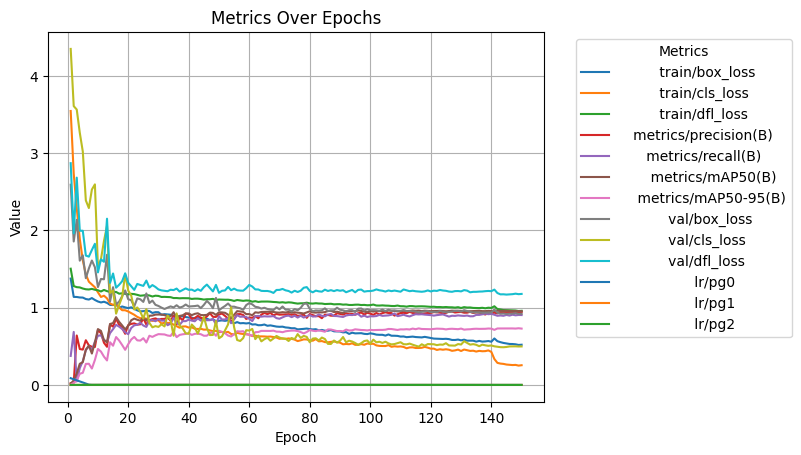

In [22]:
df = pd.read_csv("runs/detect/experiment_1/results.csv", index_col=0)

for column in df.columns:
    plt.plot(df.index, df[column], label=column)

plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Metrics Over Epochs')
plt.legend(title='Metrics', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

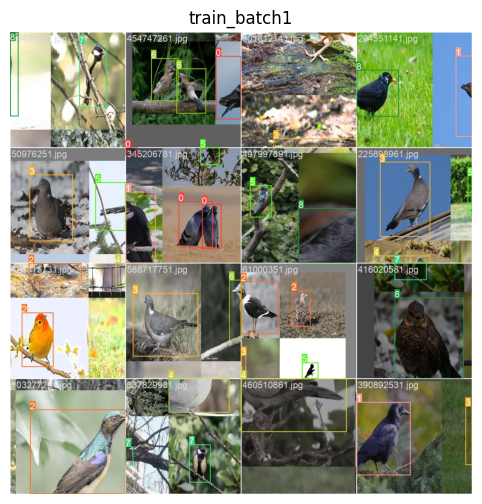

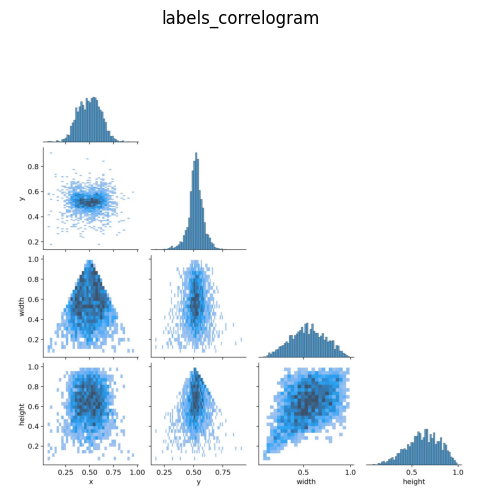

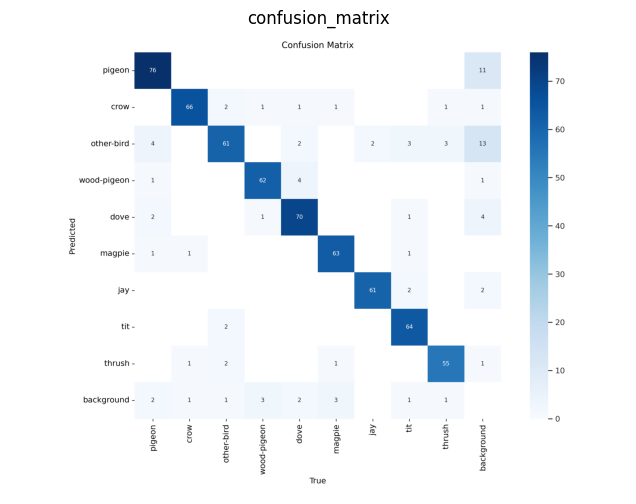

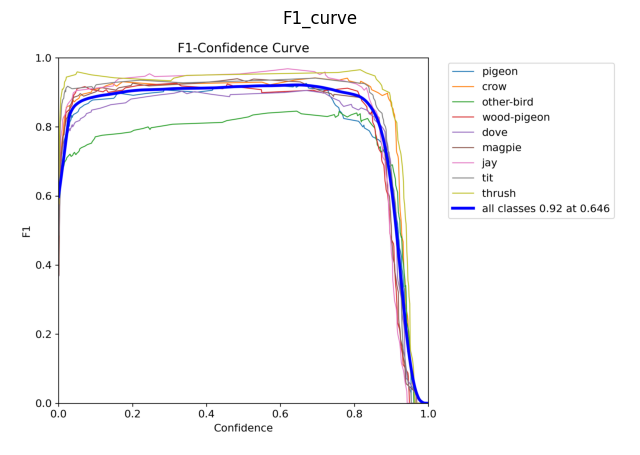

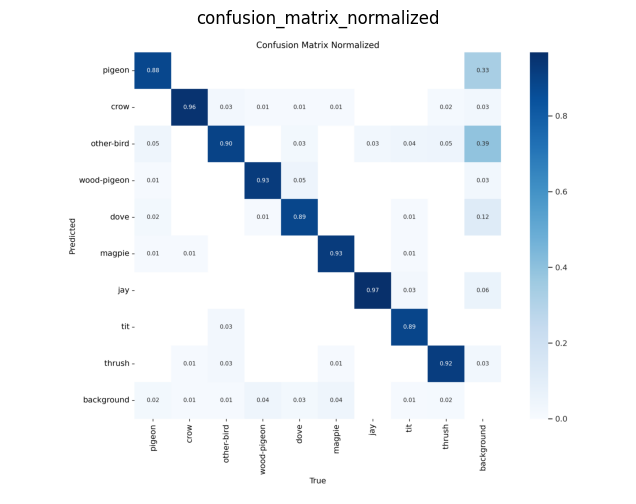

...

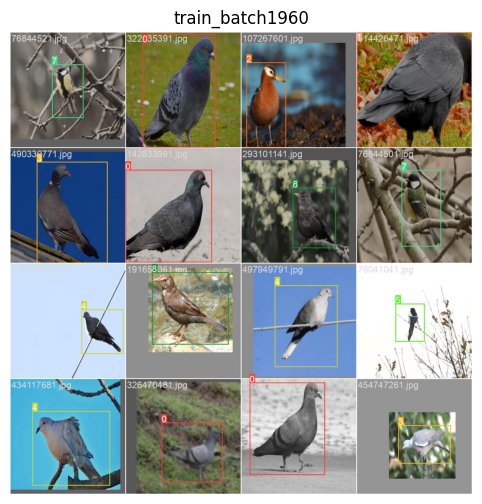

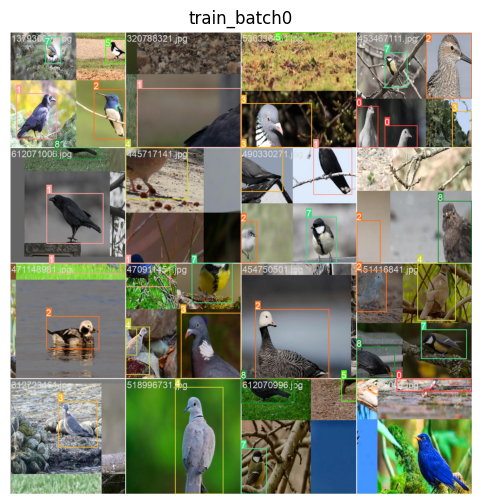

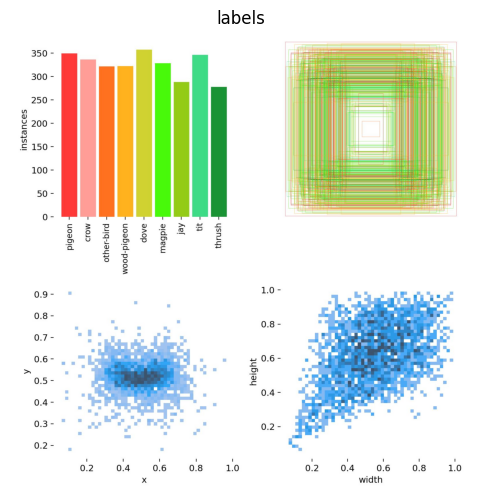

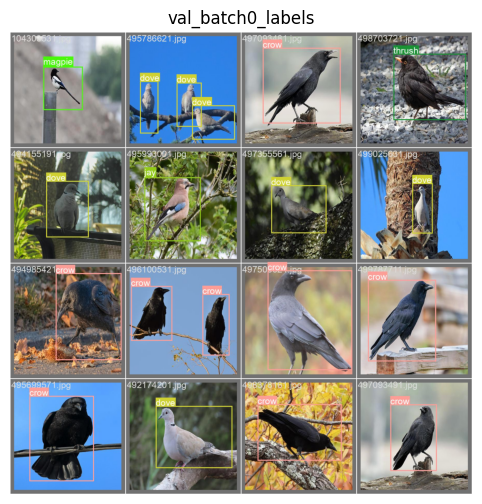

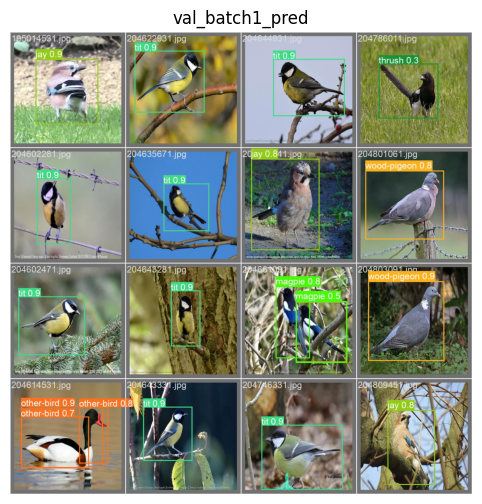

In [3]:
files = os.listdir('./runs/detect/experiment_1')

image_files = [file for file in files if file.lower().endswith(('.png', '.jpg'))]

for image_file in image_files:
    image_path = os.path.join('./runs/detect/experiment_1', image_file)
    img = Image.open(image_path)
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(os.path.splitext(image_file)[0])
    plt.axis('off')
    plt.show()

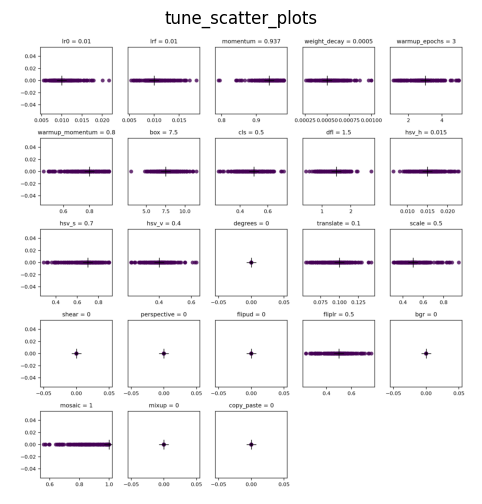

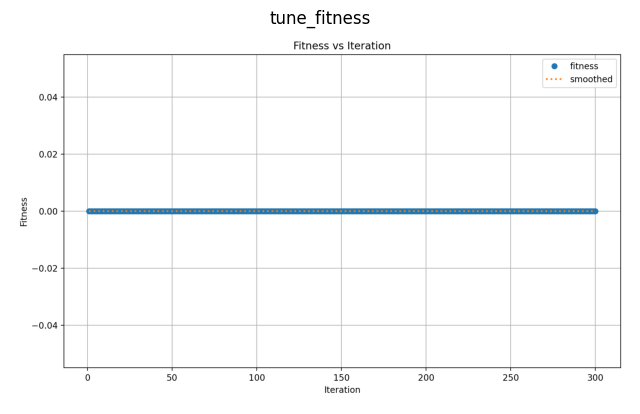

In [4]:
files = os.listdir('./runs/detect/tune')

image_files = [file for file in files if file.lower().endswith(('.png', '.jpg'))]

for image_file in image_files:
    image_path = os.path.join('./runs/detect/tune', image_file)
    img = Image.open(image_path)
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(os.path.splitext(image_file)[0])
    plt.axis('off')
    plt.show()

YOLOv8n without other-birds

In [ ]:
model = YOLO('yolov8n.pt')

model.info()

results = model.train(
    data='dataset_info.yaml',
    epochs=150,
    imgsz=416,
    device=0,
    batch=-1,
    pretrained=True,
    optimizer='Adam',
    lr0=0.001,
    momentum=0.9,
    weight_decay=0.0001,
    val=True,
    save=True,
    save_period=10,
    cache=True,
    workers=8,
    name='experiment_2_YOLOv8n_without_other-birds',
    deterministic=True,
    amp=True
)

100%|██████████| 6.23M/6.23M [00:00<00:00, 59.2MB/s]


YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=dataset_info.yaml, epochs=150, time=None, patience=100, batch=-1, imgsz=416, save=True, save_period=10, cache=True, device=0, workers=8, project=None, name=experiment_2_YOLOv8n_without_other-birds, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, 

100%|██████████| 755k/755k [00:00<00:00, 16.5MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/train... 2463 images, 22 backgrounds, 0 corrupt: 100%|██████████| 2463/2463 [03:00<00:00, 13.63it/s]


train: New cache created: /content/drive/MyDrive/dataset/dataset_split_without_other-birds/train.cache


train: Caching images (1.2GB RAM): 100%|██████████| 2463/2463 [00:21<00:00, 114.16it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/val... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [01:23<00:00,  6.33it/s] 


val: New cache created: /content/drive/MyDrive/dataset/dataset_split_without_other-birds/val.cache


val: Caching images (0.3GB RAM): 100%|██████████| 529/529 [00:05<00:00, 99.81it/s] 


Plotting labels to runs/detect/experiment_2_YOLOv8n_without_other-birds/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.000371875), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/experiment_2_YOLOv8n_without_other-birds
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      15.2G       1.46      3.557      1.568        188        416: 100%|██████████| 11/11 [00:23<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:09<00:00,  4.59s/it]

                   all        529        554    0.00936      0.534     0.0263     0.0113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      14.1G      1.209      2.832       1.32        187        416: 100%|██████████| 11/11 [00:17<00:00,  1.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all        529        554    0.00526      0.907      0.108     0.0585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      14.1G       1.16      2.414      1.274        202        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.44s/it]


                   all        529        554       0.17       0.29      0.166      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      14.1G      1.161      2.112      1.268        196        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.43s/it]

                   all        529        554      0.325      0.341      0.297      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      14.1G      1.131      1.816      1.266        200        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]

                   all        529        554      0.364      0.344      0.346      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      14.1G      1.129      1.598      1.251        214        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.20s/it]

                   all        529        554      0.556      0.506      0.523      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      14.1G      1.091      1.366      1.234        209        416: 100%|██████████| 11/11 [00:21<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.87s/it]

                   all        529        554      0.589       0.42      0.497      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      14.1G      1.113      1.282       1.23        193        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all        529        554      0.531      0.457      0.455      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      14.1G      1.094      1.241      1.235        204        416: 100%|██████████| 11/11 [00:23<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]

                   all        529        554      0.621      0.501      0.584      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      14.1G      1.105      1.203      1.234        216        416: 100%|██████████| 11/11 [00:19<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]

                   all        529        554      0.489      0.425      0.411      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      14.2G        1.1      1.164      1.229        203        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all        529        554      0.541      0.559       0.56      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      14.1G      1.073      1.129      1.223        184        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.68s/it]

                   all        529        554      0.665      0.645      0.689      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      14.1G      1.073      1.093      1.209        198        416: 100%|██████████| 11/11 [00:19<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all        529        554      0.655      0.628      0.703      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      14.1G      1.071      1.116      1.223        183        416: 100%|██████████| 11/11 [00:22<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all        529        554      0.734      0.625      0.727      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      14.1G      1.056      1.049      1.218        198        416: 100%|██████████| 11/11 [00:23<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]

                   all        529        554      0.731      0.739      0.775      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      14.1G       1.04      1.008      1.197        193        416: 100%|██████████| 11/11 [00:19<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all        529        554      0.708      0.675      0.752      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      14.1G      1.029     0.9867      1.201        204        416: 100%|██████████| 11/11 [00:22<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.744       0.78      0.845      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      14.1G      1.019     0.9738      1.193        189        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:08<00:00,  4.06s/it]

                   all        529        554      0.774      0.788      0.835      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      14.1G      1.022     0.9547      1.197        199        416: 100%|██████████| 11/11 [00:18<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.83s/it]

                   all        529        554       0.74      0.781      0.824       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      14.1G      1.008     0.9361      1.185        176        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all        529        554       0.85      0.649      0.841      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      14.2G      1.009     0.9112      1.183        221        416: 100%|██████████| 11/11 [00:23<00:00,  2.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.67s/it]

                   all        529        554      0.829      0.728      0.868      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      14.1G     0.9897      0.911      1.185        196        416: 100%|██████████| 11/11 [00:19<00:00,  1.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.91s/it]

                   all        529        554      0.712      0.775      0.846      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      14.1G     0.9997     0.8774      1.178        218        416: 100%|██████████| 11/11 [00:22<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        529        554      0.813      0.728       0.87      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      14.1G      0.978     0.8678       1.17        200        416: 100%|██████████| 11/11 [00:23<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.90s/it]

                   all        529        554      0.792       0.79      0.874      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      14.1G     0.9877      0.879      1.177        200        416: 100%|██████████| 11/11 [00:18<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.80s/it]

                   all        529        554      0.752      0.737      0.816      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      14.1G     0.9577     0.8414      1.164        196        416: 100%|██████████| 11/11 [00:22<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.645      0.689      0.754        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      14.1G     0.9719     0.8601      1.175        196        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.58s/it]

                   all        529        554      0.825      0.829      0.903      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      14.1G     0.9677     0.8412      1.169        211        416: 100%|██████████| 11/11 [00:19<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.59s/it]

                   all        529        554      0.885      0.824      0.924      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      14.1G     0.9672      0.825      1.164        194        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.861      0.854      0.896      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      14.1G     0.9369      0.797      1.145        192        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]

                   all        529        554      0.853      0.852      0.915      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      14.2G     0.9416     0.8028      1.157        207        416: 100%|██████████| 11/11 [00:21<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.85s/it]

                   all        529        554      0.805      0.818      0.888      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      14.1G     0.9456     0.8089      1.148        197        416: 100%|██████████| 11/11 [00:20<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.906       0.88      0.946      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      14.1G     0.9396     0.7887      1.152        211        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.34s/it]

                   all        529        554      0.862      0.851      0.928      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      14.1G     0.9218     0.7865      1.141        219        416: 100%|██████████| 11/11 [00:21<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.99s/it]

                   all        529        554      0.905      0.886      0.944      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      14.1G      0.909     0.7594      1.136        207        416: 100%|██████████| 11/11 [00:21<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.871      0.864      0.933       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      14.1G      0.915     0.7734      1.139        180        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]

                   all        529        554      0.914      0.863      0.938      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      14.2G     0.9032     0.7545      1.132        185        416: 100%|██████████| 11/11 [00:20<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.76s/it]

                   all        529        554      0.805      0.722      0.821      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      14.1G     0.9093     0.7472      1.139        195        416: 100%|██████████| 11/11 [00:21<00:00,  1.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.806      0.684      0.801      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      14.1G     0.9034     0.7517      1.137        203        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        529        554      0.869      0.768      0.881      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      14.1G     0.8884     0.7426      1.131        210        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.93s/it]

                   all        529        554      0.872      0.837      0.916      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      14.1G     0.8901     0.7323      1.125        220        416: 100%|██████████| 11/11 [00:20<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.876      0.825      0.918      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      14.2G     0.9059     0.7452       1.14        201        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]

                   all        529        554      0.922      0.879      0.942      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      14.1G     0.9051     0.7299      1.135        193        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.13s/it]

                   all        529        554      0.839      0.786      0.871      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      14.1G     0.8938     0.7316      1.131        193        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all        529        554      0.884      0.885      0.932      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      14.2G     0.8902      0.733      1.129        204        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all        529        554      0.905       0.87      0.936      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      14.1G      0.872     0.7388      1.124        183        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.96s/it]

                   all        529        554      0.891      0.865      0.935      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      14.1G     0.8627     0.6975      1.126        175        416: 100%|██████████| 11/11 [00:20<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.897       0.89      0.945      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      14.1G      0.869     0.6973      1.115        189        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.897      0.933       0.96      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      14.1G     0.8727     0.7065      1.124        217        416: 100%|██████████| 11/11 [00:23<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]

                   all        529        554      0.925      0.877      0.944      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      14.1G     0.8681     0.6991      1.118        198        416: 100%|██████████| 11/11 [00:19<00:00,  1.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.92s/it]

                   all        529        554      0.881      0.889      0.931      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      14.1G     0.8432      0.686      1.109        193        416: 100%|██████████| 11/11 [00:21<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.884      0.872      0.932      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      14.1G     0.8368     0.6839      1.101        205        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.31s/it]

                   all        529        554      0.865       0.88      0.942       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      14.1G     0.8527     0.6853      1.111        182        416: 100%|██████████| 11/11 [00:20<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.85s/it]

                   all        529        554      0.907      0.915      0.956      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      14.1G     0.8447      0.677      1.111        213        416: 100%|██████████| 11/11 [00:21<00:00,  1.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all        529        554      0.896      0.911      0.959      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      14.1G     0.8498     0.6642      1.104        198        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.06s/it]

                   all        529        554      0.941      0.904      0.948      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      14.1G      0.817     0.6636      1.102        196        416: 100%|██████████| 11/11 [00:19<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.59s/it]

                   all        529        554      0.922      0.908      0.957      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      14.1G     0.8204     0.6435      1.093        219        416: 100%|██████████| 11/11 [00:21<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        529        554      0.921      0.902      0.955      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      14.1G     0.8025     0.6319      1.096        205        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]

                   all        529        554      0.894      0.896      0.942      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      14.1G     0.8126     0.6369      1.097        197        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.78s/it]

                   all        529        554      0.887        0.9      0.956        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      14.1G     0.8087     0.6428      1.094        198        416: 100%|██████████| 11/11 [00:21<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        529        554       0.92      0.898      0.957      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      14.1G     0.8063     0.6421      1.093        200        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.59s/it]

                   all        529        554       0.92      0.908      0.951      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      14.1G     0.8031     0.6271      1.089        197        416: 100%|██████████| 11/11 [00:21<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.17s/it]

                   all        529        554      0.919      0.918       0.96      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      14.2G     0.8018     0.6379      1.086        192        416: 100%|██████████| 11/11 [00:20<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.917      0.918      0.955      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      14.1G     0.8064     0.6447      1.093        207        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.914      0.917      0.962      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      14.1G     0.7885     0.6305      1.088        196        416: 100%|██████████| 11/11 [00:23<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.85s/it]

                   all        529        554      0.935      0.905      0.955      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      14.1G     0.7876     0.6397      1.084        213        416: 100%|██████████| 11/11 [00:19<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554       0.93      0.933      0.969      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      14.1G     0.7846     0.6245      1.083        200        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all        529        554       0.93      0.929      0.965      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      14.1G     0.7748     0.6105      1.085        188        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]

                   all        529        554      0.897      0.924       0.96      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      14.1G     0.7764     0.6174      1.082        187        416: 100%|██████████| 11/11 [00:19<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all        529        554      0.924      0.895      0.954      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      14.1G      0.772     0.5878      1.073        189        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all        529        554      0.911      0.854      0.949      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      14.1G     0.7769     0.6078      1.077        190        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.65s/it]

                   all        529        554      0.928      0.931      0.969       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      14.1G     0.7803     0.6141      1.078        202        416: 100%|██████████| 11/11 [00:18<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.71s/it]

                   all        529        554      0.918       0.92      0.963      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      14.2G     0.7564     0.5898      1.071        199        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.904        0.9      0.946      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      14.1G     0.7567     0.5882      1.072        197        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]

                   all        529        554      0.934      0.906      0.955      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      14.1G     0.7568      0.594      1.072        201        416: 100%|██████████| 11/11 [00:21<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.56s/it]

                   all        529        554      0.943      0.883      0.964      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      14.1G     0.7471     0.5959      1.071        185        416: 100%|██████████| 11/11 [00:21<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.897      0.869      0.945      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      14.1G     0.7472     0.5809      1.069        188        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]

                   all        529        554      0.918       0.88      0.943      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      14.1G     0.7435     0.5878      1.067        188        416: 100%|██████████| 11/11 [00:21<00:00,  1.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.37s/it]

                   all        529        554      0.924      0.933      0.967      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      14.1G     0.7519     0.5827      1.073        200        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.923      0.896      0.956      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      14.2G     0.7424     0.5667      1.066        203        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.927      0.919       0.96      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      14.1G     0.7288     0.5629      1.059        239        416: 100%|██████████| 11/11 [00:23<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.67s/it]

                   all        529        554      0.936      0.891      0.967      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      14.1G     0.7386      0.573      1.067        191        416: 100%|██████████| 11/11 [00:19<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.29s/it]

                   all        529        554      0.877       0.94      0.967      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      14.1G     0.7179     0.5581      1.053        191        416: 100%|██████████| 11/11 [00:22<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554       0.92      0.897      0.952       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      14.1G     0.7329     0.5706      1.065        205        416: 100%|██████████| 11/11 [00:23<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.87s/it]

                   all        529        554      0.925      0.881      0.954      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      14.1G     0.7262     0.5645      1.063        204        416: 100%|██████████| 11/11 [00:18<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.82s/it]

                   all        529        554      0.914      0.942      0.969      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      14.1G     0.7277     0.5584       1.06        204        416: 100%|██████████| 11/11 [00:21<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.951      0.898       0.97      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      14.1G     0.7166     0.5601      1.062        192        416: 100%|██████████| 11/11 [00:22<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.74s/it]

                   all        529        554      0.907      0.905       0.96      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      14.2G      0.713     0.5533      1.051        191        416: 100%|██████████| 11/11 [00:19<00:00,  1.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.68s/it]

                   all        529        554       0.92      0.907      0.967      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      14.1G     0.7113     0.5484      1.052        193        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.922      0.935      0.973      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      14.1G     0.6971     0.5377      1.049        180        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.64s/it]

                   all        529        554      0.946      0.932      0.977      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      14.1G     0.6977     0.5432      1.049        205        416: 100%|██████████| 11/11 [00:19<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  2.00s/it]

                   all        529        554      0.929      0.934      0.971      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      14.1G     0.6924     0.5376      1.048        199        416: 100%|██████████| 11/11 [00:22<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.949      0.928      0.973      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      14.1G     0.6964     0.5392      1.046        205        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.45s/it]

                   all        529        554      0.919      0.912      0.958      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      14.1G     0.6929     0.5275      1.041        217        416: 100%|██████████| 11/11 [00:19<00:00,  1.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]

                   all        529        554       0.96      0.888      0.967       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      14.1G     0.7038     0.5397      1.053        203        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all        529        554      0.926      0.945      0.969      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      14.1G     0.6823     0.5252      1.048        202        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.77s/it]

                   all        529        554       0.94        0.9      0.967      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      14.1G     0.6762     0.5184      1.037        211        416: 100%|██████████| 11/11 [00:20<00:00,  1.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.32s/it]

                   all        529        554      0.947      0.896      0.969      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      14.2G     0.6861     0.5354      1.038        221        416: 100%|██████████| 11/11 [00:21<00:00,  1.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.20s/it]

                   all        529        554      0.934      0.908      0.965      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      14.1G     0.6749     0.5114      1.042        187        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.98s/it]

                   all        529        554      0.905      0.925      0.961      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      14.1G      0.688     0.5229      1.045        182        416: 100%|██████████| 11/11 [00:20<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.63s/it]

                   all        529        554      0.931      0.938       0.97      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      14.1G     0.6756     0.5298      1.041        205        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        529        554      0.948      0.929      0.967      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      14.1G     0.6751     0.5243      1.042        196        416: 100%|██████████| 11/11 [00:22<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.91s/it]

                   all        529        554      0.933      0.934      0.968      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      14.1G     0.6676     0.5068      1.033        228        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]

                   all        529        554       0.95      0.928      0.965       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      14.1G     0.6762     0.5208      1.043        185        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        529        554      0.935       0.93      0.968      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      14.1G     0.6647     0.5188      1.037        187        416: 100%|██████████| 11/11 [00:22<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.64s/it]

                   all        529        554      0.925      0.943      0.969      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      14.1G     0.6599     0.5155      1.029        211        416: 100%|██████████| 11/11 [00:20<00:00,  1.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.71s/it]

                   all        529        554       0.94      0.932      0.967      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      14.1G     0.6636     0.5083      1.035        230        416: 100%|██████████| 11/11 [00:21<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.934      0.916      0.968      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      14.2G     0.6517     0.5067      1.024        211        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.84s/it]

                   all        529        554       0.94      0.922      0.973       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      14.1G     0.6642     0.5048      1.034        208        416: 100%|██████████| 11/11 [00:21<00:00,  1.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.32s/it]

                   all        529        554      0.943       0.91      0.968      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      14.2G      0.642     0.4981      1.022        212        416: 100%|██████████| 11/11 [00:20<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.927      0.931      0.971      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      14.2G     0.6496     0.4994      1.028        199        416: 100%|██████████| 11/11 [00:22<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.935      0.939      0.971      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      14.1G     0.6299     0.4848      1.022        224        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.96s/it]

                   all        529        554      0.944      0.937      0.976       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      14.2G     0.6332     0.4883      1.025        205        416: 100%|██████████| 11/11 [00:19<00:00,  1.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]

                   all        529        554      0.941      0.945      0.976      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      14.1G     0.6266     0.4751       1.02        190        416: 100%|██████████| 11/11 [00:22<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.28s/it]

                   all        529        554       0.95      0.942      0.971      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      14.1G     0.6252     0.4838      1.017        211        416: 100%|██████████| 11/11 [00:23<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.51s/it]

                   all        529        554      0.939      0.928      0.966      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      14.1G     0.6257     0.4791      1.018        230        416: 100%|██████████| 11/11 [00:19<00:00,  1.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.79s/it]

                   all        529        554      0.953       0.94      0.976      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      14.1G       0.62      0.465      1.019        198        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.946      0.921      0.974      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      14.2G     0.6257     0.4901      1.015        220        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.17s/it]

                   all        529        554      0.951      0.933      0.977      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      14.2G      0.628     0.4839       1.02        179        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.82s/it]

                   all        529        554      0.957      0.919      0.973      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      14.1G     0.6246      0.493      1.024        184        416: 100%|██████████| 11/11 [00:21<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.939      0.939      0.973      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      14.2G     0.6164     0.4781      1.021        184        416: 100%|██████████| 11/11 [00:22<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.24s/it]

                   all        529        554      0.949      0.926      0.969      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      14.1G     0.6218     0.4778      1.021        210        416: 100%|██████████| 11/11 [00:19<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.81s/it]

                   all        529        554      0.954      0.927      0.975      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      14.1G     0.6292     0.4887       1.02        231        416: 100%|██████████| 11/11 [00:21<00:00,  1.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.941      0.946      0.977      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      14.1G     0.6253     0.4775      1.021        197        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.87s/it]

                   all        529        554      0.945      0.942      0.975       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      14.1G     0.6188     0.4603      1.019        204        416: 100%|██████████| 11/11 [00:20<00:00,  1.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.58s/it]

                   all        529        554      0.956      0.947      0.977      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      14.1G     0.6137     0.4648      1.018        181        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all        529        554      0.954      0.951      0.978       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      14.1G     0.6011     0.4521      1.015        188        416: 100%|██████████| 11/11 [00:23<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all        529        554      0.938      0.938      0.973      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      14.1G     0.6025     0.4601      1.013        200        416: 100%|██████████| 11/11 [00:22<00:00,  2.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.96s/it]

                   all        529        554      0.949      0.933      0.975      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      14.1G     0.5934     0.4507      1.003        215        416: 100%|██████████| 11/11 [00:21<00:00,  1.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.949      0.929      0.972       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      14.1G      0.591     0.4505      1.002        198        416: 100%|██████████| 11/11 [00:22<00:00,  2.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.81s/it]

                   all        529        554      0.932      0.945      0.974      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      14.1G     0.5974     0.4497      1.006        216        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.97s/it]

                   all        529        554      0.964      0.907      0.975      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      14.1G     0.5884     0.4468      1.008        189        416: 100%|██████████| 11/11 [00:20<00:00,  1.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.942      0.926      0.976      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      14.1G     0.5832     0.4405       1.01        204        416: 100%|██████████| 11/11 [00:23<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.21s/it]

                   all        529        554      0.959      0.918      0.975       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      14.1G     0.5918      0.444      1.008        222        416: 100%|██████████| 11/11 [00:21<00:00,  1.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:06<00:00,  3.08s/it]

                   all        529        554      0.949      0.935      0.975      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      14.1G        0.6     0.4536      1.009        226        416: 100%|██████████| 11/11 [00:21<00:00,  1.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.957      0.922      0.976      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      14.1G     0.5973     0.4435      1.009        195        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554      0.938      0.946      0.976      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      14.1G     0.5814     0.4391      1.002        224        416: 100%|██████████| 11/11 [00:22<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.55s/it]

                   all        529        554      0.947      0.932      0.977       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      14.1G     0.5751     0.4381      1.005        198        416: 100%|██████████| 11/11 [00:20<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.952      0.925      0.978      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      14.1G     0.5742     0.4402      1.001        181        416: 100%|██████████| 11/11 [00:22<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        529        554      0.958      0.921      0.977      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      14.1G     0.5776     0.4371      1.002        200        416: 100%|██████████| 11/11 [00:23<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]

                   all        529        554      0.944      0.932      0.975      0.729


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      14.1G     0.6042     0.3291      1.005         87        416: 100%|██████████| 11/11 [00:22<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        529        554       0.95      0.929      0.972      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      14.1G     0.5672     0.2779     0.9763         91        416: 100%|██████████| 11/11 [00:20<00:00,  1.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.88s/it]

                   all        529        554      0.939      0.939       0.97      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150        14G     0.5597     0.2721     0.9832         91        416: 100%|██████████| 11/11 [00:17<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.71s/it]

                   all        529        554      0.944      0.945      0.975       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      14.1G     0.5429     0.2624     0.9588         91        416: 100%|██████████| 11/11 [00:18<00:00,  1.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]

                   all        529        554      0.944      0.949      0.975      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      14.1G      0.535      0.257     0.9633         91        416: 100%|██████████| 11/11 [00:20<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        529        554       0.95      0.946      0.976      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      14.1G     0.5413     0.2626     0.9585         93        416: 100%|██████████| 11/11 [00:20<00:00,  1.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        529        554      0.961      0.937      0.977      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      14.1G     0.5369     0.2583     0.9625         88        416: 100%|██████████| 11/11 [00:20<00:00,  1.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]

                   all        529        554      0.958      0.937      0.977      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      14.1G     0.5272      0.253     0.9547         85        416: 100%|██████████| 11/11 [00:18<00:00,  1.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:07<00:00,  3.79s/it]

                   all        529        554      0.966      0.942      0.977      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150        14G     0.5234      0.251      0.962         83        416: 100%|██████████| 11/11 [00:17<00:00,  1.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.95s/it]

                   all        529        554      0.959      0.942      0.978      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      14.1G     0.5176     0.2501      0.952         86        416: 100%|██████████| 11/11 [00:19<00:00,  1.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        529        554      0.951      0.947      0.978      0.733



150 epochs completed in 1.149 hours.
Optimizer stripped from runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/best.pt, 6.2MB

Validating runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/best.pt...
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 3007208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.06s/it]


                   all        529        554      0.965      0.933      0.977      0.735
                pigeon        529         71       0.96       0.93      0.968      0.811
                  crow        529         69      0.955      0.928      0.982      0.807
           wood-pigeon        529         70      0.958      0.943      0.977      0.691
                  dove        529         78      0.972      0.875      0.975      0.702
                magpie        529         74      0.966      0.905      0.973      0.632
                   jay        529         60      0.979      0.983      0.985      0.679
                   tit        529         75      0.985      0.933      0.977      0.716
                thrush        529         57      0.946      0.965       0.98       0.84
Speed: 0.1ms preprocess, 0.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/experiment_2_YOLOv8n_without_other-birds


In [11]:
model = YOLO('runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/best.pt')

In [ ]:
benchmark(model=model, data='dataset_info.yaml', imgsz=416, device=0)

Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.9/78.2 GB disk)

Benchmarks complete for yolov8n.pt on dataset_info.yaml at imgsz=416 (635.52s)
                   Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)    FPS
0                 PyTorch       ✅        6.2               0.7350                   16.49  60.64
1             TorchScript       ✅       11.9               0.7041                   13.30  75.21
2                    ONNX       ✅       11.6               0.7041                  100.41   9.96
3                OpenVINO       ❌        0.0                  NaN                     NaN    NaN
4                TensorRT       ❎       13.5                  NaN                     NaN    NaN
5                  CoreML       ❌        0.0                  NaN                     NaN    NaN
6   TensorFlow SavedModel       ❌        0.0                  NaN                     NaN    NaN
7     TensorFlow GraphDef       ❌        0.0                  NaN                     

val: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/val.cache... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [00:00<?, ?it/s]
val: Caching images (0.3GB RAM): 100%|██████████| 529/529 [00:04<00:00, 114.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:03<00:07,  3.86s/it]

In [12]:
model.val(plots=True, imgsz=416, conf=0.7)

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.2+cu121 CPU (Intel Core(TM) i5-6600 3.30GHz)
Model summary (fused): 168 layers, 3007208 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /home/user/Projects/thesis/dataset/dataset_split_without_other-birds/val.cache... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:22<00:00,  1.52it/s]


                   all        529        554      0.976      0.906      0.947      0.745
                pigeon        529         71      0.985      0.915      0.946      0.827
                  crow        529         69      0.984      0.899      0.947      0.805
           wood-pigeon        529         70      0.969        0.9      0.942      0.696
                  dove        529         78      0.971      0.846       0.92      0.707
                magpie        529         74       0.97      0.878      0.934      0.646
                   jay        529         60      0.983      0.967      0.975      0.711
                   tit        529         75          1      0.933      0.967      0.737
                thrush        529         57      0.945      0.912      0.943       0.83
Speed: 0.7ms preprocess, 37.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /home/user/Projects/diploma/runs/detect/val16


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f27c86ca3b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

In [ ]:
model.tune(
    data='dataset_info.yaml',
    batch=-1,
    epochs=30,
    iterations=100,
    optimizer='AdamW',
    plots=True,
    save=True,
    val=True)

Tuner: Initialized Tuner instance with 'tune_dir=runs/detect/tune'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/100 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
WARNING ❌️ training failure for hyperparameter tuning iteration 1
Command '['yolo', 'train', 'task=detect', 'mode=train', 'model=runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/best.pt', 'data=dataset_info.yaml', 'epochs=30', 'time=None', 'patience=100', 'batch=-1', 'imgsz=416', 'save=True', 'save_period=-1', 'cache=False', 'device=None', 'workers=8', 'project=None', 'name=None', 'exist_ok=False', 'pretrai

YOLOv8m without other-birds

In [ ]:
model = YOLO('yolov8m.pt')

model.info()

results = model.train(
    data='dataset_info.yaml',
    epochs=150,
    imgsz=416,
    device=0,
    batch=-1,
    pretrained=True,
    optimizer='Adam',
    lr0=0.001,
    momentum=0.9,
    weight_decay=0.0001,
    val=True,
    save=True,
    save_period=10,
    cache=True,
    workers=8,
    name='experiment_3_YOLOv8m_without_other-birds',
    deterministic=True,
    amp=True
)

100%|██████████| 49.7M/49.7M [00:00<00:00, 263MB/s]


YOLOv8m summary: 295 layers, 25902640 parameters, 0 gradients, 79.3 GFLOPs
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=dataset_info.yaml, epochs=150, time=None, patience=100, batch=-1, imgsz=416, save=True, save_period=10, cache=True, device=0, workers=8, project=None, name=experiment_3_YOLOv8m_without_other-birds, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frame

100%|██████████| 755k/755k [00:00<00:00, 25.7MB/s]


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 60.4MB/s]


AMP: checks passed ✅
AutoBatch: Computing optimal batch size for imgsz=416
AutoBatch: CUDA:0 (Tesla T4) 14.75G total, 0.30G reserved, 0.24G allocated, 14.20G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    25860952       33.41         0.468         31.49         125.3        (1, 3, 416, 416)                    list
    25860952       66.83         0.614          26.9         55.74        (2, 3, 416, 416)                    list
    25860952       133.7         0.927         31.27         59.54        (4, 3, 416, 416)                    list
    25860952       267.3         1.552         40.86         67.19        (8, 3, 416, 416)                    list
    25860952       534.6         2.854          64.5         93.37       (16, 3, 416, 416)                    list
AutoBatch: Using batch-size 51 for CUDA:0 8.97G/14.75G (61%) ✅


train: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/train.cache... 2463 images, 22 backgrounds, 0 corrupt: 100%|██████████| 2463/2463 [00:00<?, ?it/s]
train: Caching images (1.2GB RAM): 100%|██████████| 2463/2463 [01:55<00:00, 21.37it/s] 


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/val.cache... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [00:00<?, ?it/s]
val: Caching images (0.3GB RAM): 100%|██████████| 529/529 [00:05<00:00, 98.99it/s] 


Plotting labels to runs/detect/experiment_3_YOLOv8m_without_other-birds/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=7.96875e-05), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/experiment_3_YOLOv8m_without_other-birds
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      9.64G      1.349      2.343      1.538         38        416: 100%|██████████| 49/49 [00:40<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.19it/s]

                   all        529        554      0.434       0.41      0.347      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150       9.5G      1.329       1.68      1.473         36        416: 100%|██████████| 49/49 [00:36<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.137      0.277     0.0141    0.00645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150       9.5G      1.397      1.759       1.47         28        416: 100%|██████████| 49/49 [00:36<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.60it/s]


                   all        529        554      0.465      0.131      0.046     0.0133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      9.51G      1.393      1.684      1.459         37        416: 100%|██████████| 49/49 [00:36<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


                   all        529        554      0.488      0.308      0.207     0.0973

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      9.51G      1.305      1.493      1.395         31        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


                   all        529        554      0.495      0.374       0.36      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      9.52G      1.273      1.382      1.374         44        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        529        554      0.811      0.511      0.671      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      9.51G      1.243      1.285      1.346         31        416: 100%|██████████| 49/49 [00:36<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]

                   all        529        554      0.549      0.485      0.512      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      9.51G      1.175      1.206      1.298         26        416: 100%|██████████| 49/49 [00:36<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]

                   all        529        554      0.438      0.587      0.533      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      9.53G      1.159      1.186      1.293         41        416: 100%|██████████| 49/49 [00:36<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.23it/s]


                   all        529        554      0.579      0.487      0.492      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      9.51G      1.146      1.109       1.28         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]


                   all        529        554      0.673      0.737       0.77      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      9.51G      1.114      1.076      1.259         34        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.42it/s]

                   all        529        554      0.703       0.74      0.816      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      9.53G      1.128      1.079       1.27         44        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]


                   all        529        554      0.739      0.692      0.791      0.532

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      9.52G      1.096      1.022      1.244         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        529        554      0.774       0.78      0.846      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      9.51G      1.077      0.994      1.238         39        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]

                   all        529        554      0.754      0.779       0.86       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150       9.5G      1.052      0.965       1.23         39        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        529        554      0.827      0.794      0.883       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      9.51G      1.056     0.9503      1.229         34        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]

                   all        529        554      0.803      0.767      0.871      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      9.51G       1.03      0.939      1.217         44        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.50it/s]


                   all        529        554      0.878      0.844      0.917      0.636

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150       9.5G      1.021     0.9171       1.21         32        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]

                   all        529        554      0.791      0.803      0.864      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150       9.5G      1.001     0.8946      1.203         44        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


                   all        529        554      0.869      0.812      0.911      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150       9.5G      1.002     0.8704      1.195         39        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        529        554      0.878      0.867       0.92      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      9.52G     0.9903      0.884      1.197         27        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]

                   all        529        554      0.835      0.765      0.863      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      9.51G      0.971     0.8611      1.184         43        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.839        0.8        0.9      0.623

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      9.51G     0.9617     0.8518      1.178         31        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


                   all        529        554      0.817      0.781      0.871      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150       9.5G     0.9543     0.8229      1.174         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]

                   all        529        554      0.841      0.839      0.903      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      9.52G      0.927     0.8021      1.159         33        416: 100%|██████████| 49/49 [00:36<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]

                   all        529        554      0.886       0.82      0.907      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      9.51G      0.941     0.8047      1.165         35        416: 100%|██████████| 49/49 [00:36<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]


                   all        529        554      0.847        0.8      0.893      0.618

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      9.51G     0.9133     0.8086      1.159         39        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]


                   all        529        554      0.904      0.831      0.921      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      9.51G       0.91     0.7748      1.159         34        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


                   all        529        554       0.87      0.794       0.89      0.621

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      9.51G     0.8878     0.7615      1.142         44        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        529        554      0.893      0.883      0.927      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      9.52G     0.8971     0.7591      1.141         42        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        529        554      0.875      0.871      0.924      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150       9.5G     0.8832     0.7346      1.144         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]

                   all        529        554      0.892      0.833      0.919       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      9.51G     0.8651     0.7272      1.128         42        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]


                   all        529        554      0.893      0.875      0.932      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      9.51G     0.8668     0.7423      1.135         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        529        554      0.855      0.792      0.882      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150       9.5G     0.8501      0.722      1.121         34        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.911      0.899      0.937       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150       9.5G     0.8426      0.718      1.124         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]

                   all        529        554      0.904      0.866      0.937      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      9.51G     0.8364     0.7136      1.122         33        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]

                   all        529        554      0.878      0.859      0.929      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      9.51G     0.8378     0.7028       1.12         32        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]

                   all        529        554      0.913      0.856      0.931      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      9.51G     0.8202     0.6808      1.111         31        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.40it/s]


                   all        529        554      0.911      0.884      0.944      0.657

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      9.51G       0.82     0.6802      1.112         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]

                   all        529        554      0.895      0.889      0.938      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      9.52G     0.8081     0.6734      1.113         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.57it/s]

                   all        529        554      0.899      0.915      0.944      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      9.51G     0.7956     0.6757      1.102         36        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.886      0.833      0.917      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      9.51G     0.7998     0.6816      1.098         39        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]

                   all        529        554      0.921      0.894      0.953      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150       9.5G     0.7923     0.6589      1.099         43        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]

                   all        529        554        0.9      0.896      0.937      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      9.51G     0.7807     0.6534      1.092         32        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.892       0.87      0.945      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150       9.5G     0.7685     0.6425      1.091         45        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


                   all        529        554      0.913      0.899      0.951      0.668

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      9.52G     0.7481     0.6452      1.079         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.903      0.897       0.95      0.666

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      9.51G     0.7434     0.6261      1.083         26        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]

                   all        529        554      0.933      0.873      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150       9.5G     0.7505     0.6373      1.079         44        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]

                   all        529        554      0.906      0.885      0.944      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      9.53G     0.7512     0.6264      1.087         29        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]

                   all        529        554      0.915      0.897      0.952       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150       9.5G     0.7305     0.6061      1.069         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.893      0.918      0.954      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      9.51G     0.7294     0.6205      1.082         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]

                   all        529        554      0.913      0.931      0.967      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150       9.5G     0.7225     0.6064      1.069         34        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.901      0.889      0.952       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      9.51G     0.7141        0.6      1.069         33        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]


                   all        529        554       0.89      0.912      0.951      0.684

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150       9.5G     0.7076     0.5964      1.063         32        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.906      0.857      0.946      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      9.51G     0.6982     0.5982      1.059         30        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.913      0.907      0.958       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      9.52G     0.6886     0.5814      1.061         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]

                   all        529        554      0.928      0.876      0.952       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      9.51G     0.6967     0.5746      1.057         41        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]


                   all        529        554      0.943      0.916      0.962      0.705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      9.53G     0.7029     0.5835      1.061         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.911      0.914       0.96      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      9.53G     0.6838     0.5679      1.056         30        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


                   all        529        554      0.919      0.917      0.958      0.696

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      9.53G     0.6683     0.5646      1.052         34        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.889      0.921      0.959      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      9.52G     0.6711     0.5757      1.048         28        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.937      0.893      0.957      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150       9.5G     0.6748     0.5595      1.054         36        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


                   all        529        554      0.867      0.906      0.949       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150       9.5G     0.6626     0.5615      1.046         38        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.902      0.905      0.951      0.684

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      9.51G     0.6496     0.5568      1.043         26        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.934      0.904       0.96      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      9.51G     0.6515     0.5504      1.043         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.932      0.908      0.957      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      9.51G     0.6387     0.5458      1.038         32        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.22it/s]

                   all        529        554      0.924       0.89      0.954        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      9.51G      0.626     0.5381       1.03         39        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]

                   all        529        554      0.927      0.899      0.954      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      9.51G     0.6343     0.5362      1.031         30        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]


                   all        529        554      0.904      0.883      0.942      0.676

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      9.51G     0.6229     0.5225      1.033         43        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        529        554      0.904      0.927      0.953      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      9.51G     0.6331     0.5318      1.035         37        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.898       0.93      0.959       0.71

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      9.51G     0.6125     0.5223      1.027         30        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]

                   all        529        554        0.9      0.916      0.949       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      9.51G     0.6077     0.5217      1.022         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]

                   all        529        554      0.917      0.896      0.953      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      9.53G     0.6063     0.5121      1.022         44        416: 100%|██████████| 49/49 [00:38<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.22it/s]

                   all        529        554      0.937      0.916      0.961      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      9.51G      0.599     0.5101      1.018         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.921      0.925      0.959      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150       9.5G     0.5953     0.4862       1.02         32        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.916      0.902       0.96       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      9.52G      0.596     0.4998      1.022         36        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]

                   all        529        554      0.913      0.915      0.962      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      9.53G     0.5928     0.4822      1.018         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]

                   all        529        554      0.933      0.913      0.963      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      9.49G     0.5808     0.4855      1.013         30        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]

                   all        529        554      0.944      0.927      0.962      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      9.53G     0.5805     0.4823      1.013         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]


                   all        529        554      0.915      0.925      0.965      0.711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      9.52G     0.5861     0.4969      1.024         36        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]


                   all        529        554      0.945      0.927      0.967      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150       9.5G     0.5719     0.4728      1.011         40        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.933       0.92      0.966      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      9.53G     0.5564     0.4739      1.003         38        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]

                   all        529        554      0.923      0.932      0.963      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150       9.5G     0.5648     0.4666      1.005         37        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.929       0.93      0.967      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      9.53G     0.5707      0.477      1.013         33        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]


                   all        529        554      0.934      0.925      0.964      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      9.51G      0.557     0.4588      1.008         33        416: 100%|██████████| 49/49 [00:38<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.41it/s]


                   all        529        554       0.95      0.917      0.967      0.706

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      9.51G     0.5582     0.4617      1.005         34        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.929      0.934      0.966      0.711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      9.51G     0.5458     0.4568     0.9996         31        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        529        554      0.926      0.925      0.966      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      9.52G     0.5547      0.472      1.005         23        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]

                   all        529        554      0.932      0.915      0.964      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150       9.5G     0.5554     0.4704      1.008         34        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.933      0.926      0.967       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      9.51G     0.5463      0.459      1.004         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


                   all        529        554      0.939      0.909      0.961      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      9.51G     0.5372      0.449     0.9978         39        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]

                   all        529        554      0.927       0.93      0.959      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150       9.5G     0.5188     0.4397     0.9861         41        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.928      0.928      0.961      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      9.51G     0.5294     0.4255     0.9917         33        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.45it/s]

                   all        529        554      0.926      0.926      0.961      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      9.52G     0.5207     0.4468      0.992         29        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.24it/s]

                   all        529        554      0.926      0.944      0.965      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      9.52G     0.5152     0.4231     0.9877         42        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]


                   all        529        554      0.943      0.938      0.967      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      9.51G     0.5114     0.4253     0.9874         32        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.913      0.942      0.961      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      9.51G     0.4981     0.4172     0.9793         36        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]

                   all        529        554      0.942      0.916      0.968      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150       9.5G     0.5117      0.418     0.9887         36        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.956      0.923      0.965      0.712

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      9.52G     0.4988     0.4209     0.9838         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]


                   all        529        554      0.928      0.949      0.967      0.717

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      9.52G     0.5033     0.4157     0.9835         40        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.38it/s]

                   all        529        554       0.94      0.925      0.963      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      9.51G     0.4952     0.4027     0.9747         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]


                   all        529        554      0.916      0.946      0.967      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      9.51G     0.4849     0.3985     0.9745         33        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]


                   all        529        554      0.926       0.94      0.966      0.718

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150       9.5G     0.4897     0.4107     0.9782         37        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]


                   all        529        554      0.925      0.953      0.967      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      9.51G     0.4843     0.4067     0.9774         33        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]


                   all        529        554      0.923      0.934      0.962      0.715

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      9.53G     0.4802     0.4039       0.97         40        416: 100%|██████████| 49/49 [00:38<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]


                   all        529        554      0.941      0.944      0.963      0.715

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150       9.5G     0.4757     0.4016     0.9735         42        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.949      0.947      0.966      0.722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150       9.5G      0.465     0.3897     0.9723         29        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]

                   all        529        554      0.917      0.946      0.966       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      9.52G       0.46     0.3762     0.9623         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.21it/s]

                   all        529        554      0.923      0.946      0.967      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      9.52G     0.4679     0.3879     0.9745         32        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]

                   all        529        554      0.938      0.943      0.965      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      9.51G     0.4688     0.3885     0.9675         37        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554       0.95      0.917      0.961      0.712

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150       9.5G     0.4645      0.391     0.9706         43        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.945      0.937       0.97      0.726

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      9.51G     0.4677     0.3905     0.9702         29        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]

                   all        529        554      0.944      0.934      0.965      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      9.49G     0.4525     0.3795     0.9667         38        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]

                   all        529        554      0.954      0.925      0.968      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      9.51G     0.4515     0.3801      0.966         39        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]


                   all        529        554       0.95      0.926      0.964      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      9.49G     0.4469     0.3718     0.9607         41        416: 100%|██████████| 49/49 [00:39<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]


                   all        529        554      0.946      0.937      0.967      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150       9.5G     0.4471     0.3728     0.9618         30        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554      0.944      0.936      0.966      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      9.51G     0.4454     0.3663     0.9637         39        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.937      0.945      0.967      0.721

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      9.51G     0.4359     0.3583     0.9592         40        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]

                   all        529        554      0.924      0.946      0.967      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      9.51G     0.4357     0.3673      0.959         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.942      0.934       0.97       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      9.51G     0.4201     0.3532     0.9474         39        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]

                   all        529        554      0.951      0.941      0.968      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      9.51G     0.4345     0.3561     0.9563         34        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.42it/s]


                   all        529        554      0.951      0.939      0.967      0.724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      9.52G     0.4132      0.334     0.9481         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554       0.94      0.938      0.966      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      9.51G     0.4271     0.3492     0.9519         35        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.55it/s]

                   all        529        554       0.94      0.947      0.974      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150       9.5G     0.4133     0.3407      0.948         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.953      0.938      0.965      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150       9.5G     0.4197     0.3465     0.9537         40        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]

                   all        529        554      0.948      0.932      0.964      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      9.52G     0.4155     0.3407     0.9497         46        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        529        554      0.952      0.934      0.974      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      9.51G     0.4054     0.3372     0.9459         34        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.56it/s]


                   all        529        554      0.948      0.941      0.972      0.729

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      9.51G     0.4023     0.3363     0.9472         35        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.952       0.94      0.972      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      9.51G      0.405     0.3226     0.9467         28        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        529        554      0.955      0.942      0.976      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      9.51G     0.3882     0.3209     0.9416         39        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]

                   all        529        554      0.948      0.937       0.97      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      9.51G     0.3976     0.3308     0.9424         32        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]


                   all        529        554      0.953      0.932      0.968      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150       9.5G     0.4004     0.3245     0.9477         34        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.929      0.956      0.968      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      9.51G     0.3877     0.3217     0.9402         30        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.953      0.941      0.969       0.73

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      9.52G     0.3884      0.318     0.9421         38        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.47it/s]

                   all        529        554       0.95      0.943       0.97      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      9.49G     0.3846     0.3206     0.9421         38        416: 100%|██████████| 49/49 [00:37<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.37it/s]

                   all        529        554      0.946      0.942      0.969      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150       9.5G     0.3839      0.315     0.9434         28        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]


                   all        529        554       0.95      0.943      0.969      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      9.51G      0.379     0.3075     0.9351         34        416: 100%|██████████| 49/49 [00:38<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.48it/s]


                   all        529        554      0.953      0.945      0.971      0.729

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      9.51G     0.3751     0.3092     0.9351         36        416: 100%|██████████| 49/49 [00:38<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.54it/s]


                   all        529        554      0.959      0.938      0.971      0.734

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      9.51G      0.367     0.2979     0.9344         32        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.51it/s]

                   all        529        554      0.951       0.94      0.971      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      9.51G     0.3712     0.3005     0.9326         38        416: 100%|██████████| 49/49 [00:38<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]


                   all        529        554      0.949      0.947      0.969      0.736
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150       9.5G     0.6068     0.3007      1.029         15        416: 100%|██████████| 49/49 [00:40<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]

                   all        529        554      0.933      0.947      0.965      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      9.51G     0.5736     0.2602     0.9944         17        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.949      0.944      0.965      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      9.51G     0.5675     0.2622      0.985         15        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.53it/s]


                   all        529        554      0.938      0.957      0.966      0.735

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150       9.5G     0.5512     0.2534     0.9806         15        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]

                   all        529        554      0.943      0.956      0.968      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150       9.5G     0.5456     0.2493     0.9692         15        416: 100%|██████████| 49/49 [00:39<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.49it/s]

                   all        529        554      0.948      0.954      0.971      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150       9.5G     0.5376     0.2429     0.9639         17        416: 100%|██████████| 49/49 [00:37<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]

                   all        529        554      0.945      0.956      0.971      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      9.51G     0.5297     0.2403     0.9687         16        416: 100%|██████████| 49/49 [00:37<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]

                   all        529        554      0.954      0.952      0.972      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      9.51G     0.5239     0.2355     0.9652         15        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.52it/s]


                   all        529        554      0.953      0.952      0.973      0.738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150       9.5G     0.5156     0.2312     0.9524         15        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]

                   all        529        554       0.95      0.952      0.971      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150       9.5G      0.519     0.2343     0.9629         14        416: 100%|██████████| 49/49 [00:37<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]

                   all        529        554      0.951      0.953      0.971      0.739



150 epochs completed in 1.831 hours.
Optimizer stripped from runs/detect/experiment_3_YOLOv8m_without_other-birds/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/experiment_3_YOLOv8m_without_other-birds/weights/best.pt, 52.0MB

Validating runs/detect/experiment_3_YOLOv8m_without_other-birds/weights/best.pt...
Ultralytics YOLOv8.2.11 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25844392 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:06<00:00,  1.07s/it]


                   all        529        554      0.951      0.954      0.971      0.739
                pigeon        529         71      0.957      0.951       0.98      0.819
                  crow        529         69      0.922          1      0.984      0.819
           wood-pigeon        529         70      0.957      0.949      0.968      0.689
                  dove        529         78      0.936      0.939      0.965      0.697
                magpie        529         74       0.97      0.919      0.932      0.641
                   jay        529         60      0.966      0.941      0.988      0.702
                   tit        529         75      0.976      0.947      0.976      0.701
                thrush        529         57      0.927      0.982      0.979      0.843
Speed: 0.1ms preprocess, 4.5ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/experiment_3_YOLOv8m_without_other-birds


In [13]:
model = YOLO('runs/detect/experiment_3_YOLOv8m_without_other-birds/weights/best.pt')

In [14]:
model.val(plots=True, imgsz=416, conf=0.7)

Ultralytics YOLOv8.1.47 🚀 Python-3.10.12 torch-2.2.2+cu121 CPU (Intel Core(TM) i5-6600 3.30GHz)
Model summary (fused): 218 layers, 25844392 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /home/user/Projects/thesis/dataset/dataset_split_without_other-birds/val.cache... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [01:51<00:00,  3.26s/it]


                   all        529        554      0.963      0.921      0.953      0.751
                pigeon        529         71          1      0.887      0.944       0.82
                  crow        529         69      0.915      0.942      0.963      0.815
           wood-pigeon        529         70      0.941      0.914      0.937      0.693
                  dove        529         78      0.959      0.897       0.94       0.73
                magpie        529         74      0.971      0.919       0.95       0.68
                   jay        529         60      0.982      0.917      0.957      0.691
                   tit        529         75          1      0.907      0.953      0.708
                thrush        529         57      0.933      0.982      0.978      0.869
Speed: 0.6ms preprocess, 205.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /home/user/Projects/diploma/runs/detect/val17


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f276b7f0f10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

In [ ]:
benchmark(model=model, data='dataset_info.yaml', imgsz=416, device=0)

Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.0/78.2 GB disk)

Benchmarks complete for best.pt on dataset_info.yaml at imgsz=416 (1071.93s)
                   Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)    FPS
0                 PyTorch       ✅       49.6               0.7383                   19.57  51.10
1             TorchScript       ✅       99.1               0.7232                   12.45  80.33
2                    ONNX       ✅       98.7               0.7232                  659.06   1.52
3                OpenVINO       ❌        0.0                  NaN                     NaN    NaN
4                TensorRT       ❎      122.5                  NaN                     NaN    NaN
5                  CoreML       ❌        0.0                  NaN                     NaN    NaN
6   TensorFlow SavedModel       ❌        0.0                  NaN                     NaN    NaN
7     TensorFlow GraphDef       ❌        0.0                  NaN                     Na

val: Scanning /content/drive/MyDrive/dataset/dataset_split_without_other-birds/val.cache... 529 images, 9 backgrounds, 0 corrupt: 100%|██████████| 529/529 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:52<00:00,  1.55s/it]


                   all        529        554      0.952      0.953      0.967      0.761
                pigeon        529         71      0.957      0.951      0.978      0.841
                  crow        529         69      0.923          1      0.984      0.837
           wood-pigeon        529         70      0.957      0.949       0.96        0.7
                  dove        529         78      0.936      0.939      0.959       0.73
                magpie        529         74      0.971      0.919      0.941      0.678
                   jay        529         60      0.966      0.941      0.969      0.718
                   tit        529         75      0.976      0.947      0.972      0.735
                thrush        529         57      0.927      0.982      0.975      0.848
Speed: 25.0ms preprocess, 51.3ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val11


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b46c78ed990>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

In [ ]:
model.tune(
    data='dataset_info.yaml',
    batch=-1,
    epochs=30,
    iterations=100,
    optimizer='AdamW',
    plots=True,
    save=True,
    val=True)

Tuner: Initialized Tuner instance with 'tune_dir=runs/detect/tune'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/100 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
WARNING ❌️ training failure for hyperparameter tuning iteration 1
Command '['yolo', 'train', 'task=detect', 'mode=train', 'model=drive/MyDrive/file3/detect/experiment_3_YOLOv8m_without_other-birds/weights/best.pt', 'data=dataset_info.yaml', 'epochs=30', 'time=None', 'patience=100', 'batch=-1', 'imgsz=416', 'save=True', 'save_period=-1', 'cache=False', 'device=None', 'workers=8', 'project=None', 'name=None', 'exist_ok=F

**Testing the Model**

In [3]:
model = YOLO('runs/detect/experiment_2_YOLOv8n_without_other-birds/weights/best.pt')

testing model on images

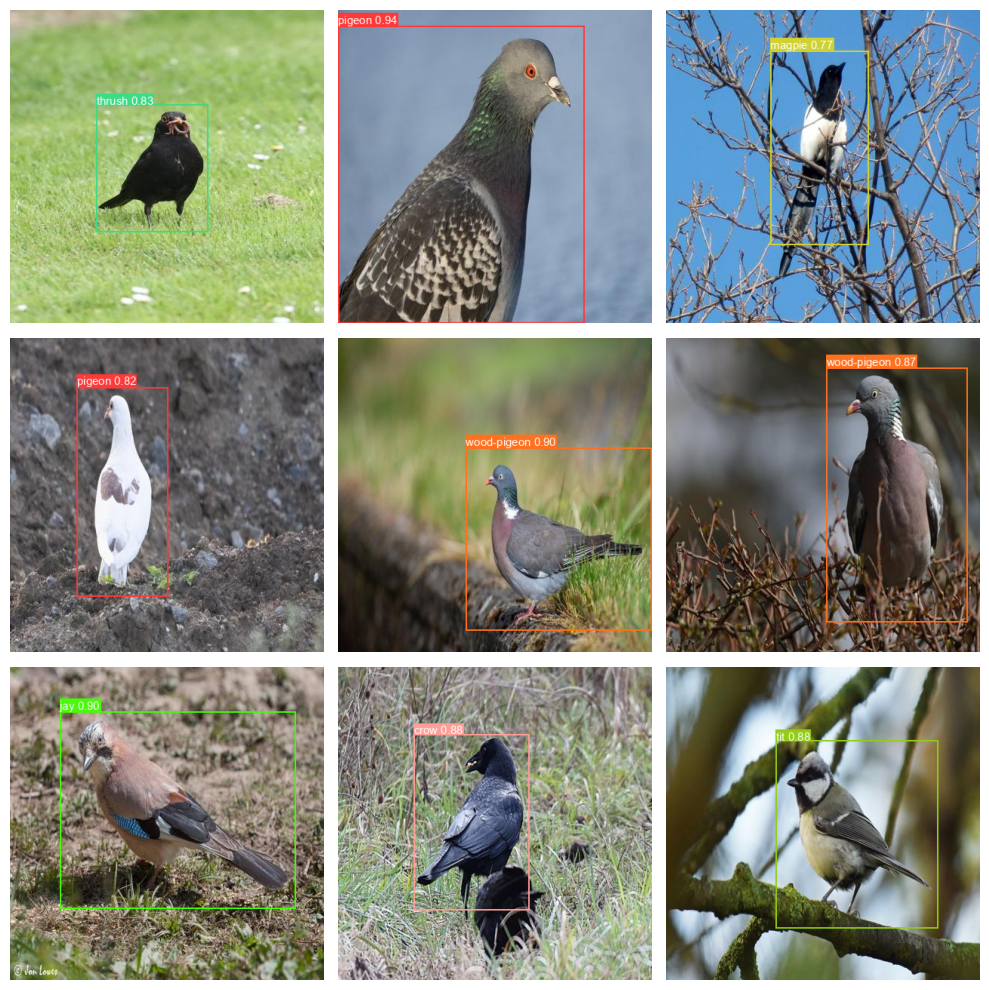

In [9]:
images_paths = [os.path.join(dataset_directory, 'dataset_split_without_other-birds', sets[2], file) for file in os.listdir(os.path.join(dataset_directory, 'dataset_split_without_other-birds', sets[2])) if file.endswith('.jpg')]

results = model.predict(images_paths[:9], verbose=False)

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
axes = axes.flatten()

for i, result in enumerate(results):
    image = result.plot(pil=True)
    image = image[..., ::-1]
    axes[i].imshow(image)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

testing model on local videos

In [10]:
video_path = "./test/video.mp4"
output_video_path = "./test/output_video.mp4"
cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_video = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))
speed_values = []

while cap.isOpened():
    success, frame = cap.read()

    if success:
        results = model.track(frame, persist=True)
        speed_values.append(results[0].speed['preprocess'] + results[0].speed['inference'] + results[0].speed['postprocess'])

        annotated_frame = results[0].plot()
        output_video.write(annotated_frame)

        cv2.imshow("Video Feed", annotated_frame)

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

average_speed = sum(speed_values) / len(speed_values)
print("Average FPS:", 1000 / average_speed)

cap.release()
output_video.release()
cv2.destroyAllWindows()


0: 256x416 (no detections), 137.1ms
Speed: 20.3ms preprocess, 137.1ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)


W0511 13:31:34.917526  8984 default_variables.cpp:287] Fail to fscanf: Success [0]



0: 256x416 (no detections), 147.3ms
Speed: 30.4ms preprocess, 147.3ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 62.6ms
Speed: 18.2ms preprocess, 62.6ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 47.8ms
Speed: 6.7ms preprocess, 47.8ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 51.5ms
Speed: 3.3ms preprocess, 51.5ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 53.2ms
Speed: 1.6ms preprocess, 53.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 35.4ms
Speed: 9.7ms preprocess, 35.4ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 44.2ms
Speed: 5.6ms preprocess, 44.2ms inference, 0.3ms postprocess per image at shape (1, 3, 256, 416)

0: 256x416 (no detections), 47.3ms
Speed: 4.3ms preprocess, 47.3

testing model from the camera feed

In [ ]:
cap = cv2.VideoCapture(0)

output_video_path = "./test/camera_output_video.mp4"

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_video = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

if not cap.isOpened():
    exit()

while True:
    ret, frame = cap.read()

    if not ret:
        break

    results = model.track(frame, persist=True)

    annotated_frame = results[0].plot()
    output_video.write(annotated_frame)

    cv2.imshow('Camera Feed', annotated_frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
output_video.release()
cv2.destroyAllWindows()